# SWE Reanalysis EOF and K-Means Clustering

To Do:  
* ~~Run EOF for just CO with SWE, can try using Steven's package~~  
* ~~Upscale CO raster to coarser resolution~~  
* ~~Run K means clustering on coarse CO~~  
* ~~Test Michelle's code for array shaping~~   

### Load necessary packages and data:

In [1]:
import numpy as np
import os
import geopandas as gpd
import pandas as pd
import matplotlib.pyplot as plt
from matplotlib.colors import LinearSegmentedColormap
#from mpl_toolkits.axes_grid1.axes_divider import make_axes_locatable
import contextily as ctx
#import ulmo
import datetime as dt
from datetime import datetime
#from shapely.geometry import Point
#import metloom
#from metloom.pointdata import CDECPointData
#from metloom.pointdata import SnotelPointData
#from metloom.variables import CdecStationVariables
import pickle
import scipy.stats as stats
# SVD function from scipy
from scipy.linalg import svd
import sklearn
from sklearn.cluster import KMeans

import rioxarray as rxr
import xarray as xr
import rasterio as rio
import matplotlib
#import regionmask

In [2]:
wstates = gpd.read_file('../data/misc/western_states.shp')
wstates_4326=wstates.to_crs('epsg:4326')

wstates_boundary = gpd.read_file('../data/misc/western_boundary.geojson')
western_snotel_locations = pickle.load(open('../data/snotel/western_snotel_locations.pkl', 'rb'))

### Load April 1 SWE reanalysis product from 1990 - 2021:

In [3]:
ds = xr.open_dataset('../data/reanalysis/SWE_reanalysis_32yrs.nc')

### Calculate the 32-year SWE Reanalysis mean:  
Exclude pixels with <0.1 mm SWE

In [4]:
mean_swe = ds.SWE_Post.mean(dim='Year').where(ds.SWE_Post.mean(dim='Year')>0.1)

### Calculate standard deviation of the SWE data:

In [5]:
ds_stdev = ds.SWE_Post.std(dim='Year', skipna=True, ddof=1).where(ds.SWE_Post.mean(dim='Year')>0.1)

/Users/Hannah/micromamba/envs/analysis_2024/lib/python3.12/site-packages/numpy/lib/nanfunctions.py:1879: RuntimeWarning: Degrees of freedom <= 0 for slice.
  var = nanvar(a, axis=axis, dtype=dtype, out=out, ddof=ddof,


### Calculate Standard Normal Variates as a DataSet at the original resolution:

In [6]:
reanalysis_snv = (ds.SWE_Post - mean_swe) / ds_stdev

### Remove Nans:

#### Original high resolution:

In [55]:
# Get into non nan space:
x_arr = reanalysis_snv.x.values
y_arr = reanalysis_snv.y.values
anol_arr = reanalysis_snv.values

In [56]:
anol_flat = reanalysis_snv[0].values.flatten()

In [57]:
anol_flat_3d = reanalysis_snv.values.flatten()

In [58]:
y_nonnan = y_arr[np.argwhere(~np.isnan(anol_arr[0,:,:]))[:,0]]
x_nonnan = x_arr[np.argwhere(~np.isnan(anol_arr[0,:,:]))[:,1]]

In [59]:
anol_nonnan = anol_arr[~np.isnan(anol_arr)].reshape(32,x_nonnan.shape[0])

In [60]:
anol_nonnan.shape

(32, 2152529)

In [61]:
n_clusters_kmeans = 5
kmeans_5 = KMeans(n_clusters = n_clusters_kmeans, init = 'k-means++', max_iter = 300, n_init = 10, random_state = 0)
clusters_5 = kmeans_5.fit_predict(anol_nonnan.T)

In [67]:
n_clusters_kmeans = 6
kmeans_6 = KMeans(n_clusters = n_clusters_kmeans, init = 'k-means++', max_iter = 300, n_init = 10, random_state = 0)
clusters_6 = kmeans_6.fit_predict(anol_nonnan.T)

In [62]:
# Get back to nan space:

output_flat = np.ones((reanalysis_snv.shape[1]*reanalysis_snv.shape[2])) * -1

output_flat[np.argwhere(~np.isnan(anol_flat)).reshape(clusters_5.shape[0])] = clusters_5

output_reshaped = output_flat.reshape(
    reanalysis_snv.shape[1], reanalysis_snv.shape[2]
)

output_reshaped = output_reshaped.astype(int)

output_dataArray_5 = xr.DataArray(data = output_reshaped,
                           dims=("y","x"),
                           coords=[reanalysis_snv.y,reanalysis_snv.x])
output_dataArray_5_masked = output_dataArray_5.where(output_dataArray_5!=-1)

In [68]:
# Get back to nan space:

output_flat = np.ones((reanalysis_snv.shape[1]*reanalysis_snv.shape[2])) * -1

output_flat[np.argwhere(~np.isnan(anol_flat)).reshape(clusters_6.shape[0])] = clusters_6

output_reshaped = output_flat.reshape(
    reanalysis_snv.shape[1], reanalysis_snv.shape[2]
)

output_reshaped = output_reshaped.astype(int)

output_dataArray_6 = xr.DataArray(data = output_reshaped,
                           dims=("y","x"),
                           coords=[reanalysis_snv.y,reanalysis_snv.x])
output_dataArray_6_masked = output_dataArray_6.where(output_dataArray_6!=-1)

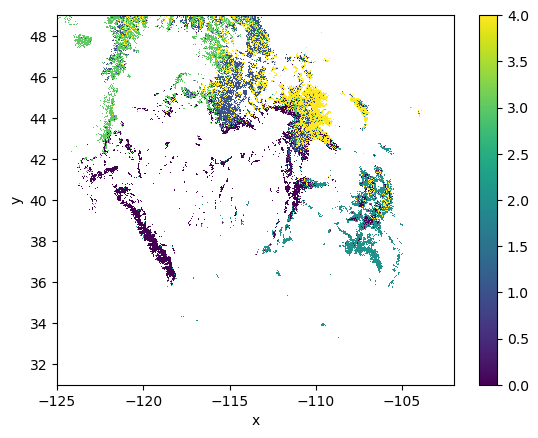

In [18]:
output_dataArray_6_masked.plot()

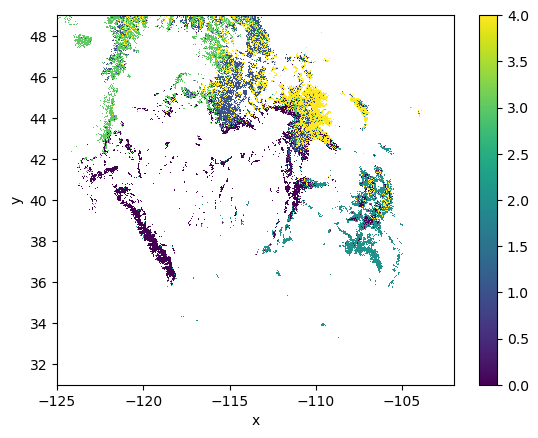

In [14]:
output_dataArray_5_masked.plot()

<Axes: xlabel='x', ylabel='y'>

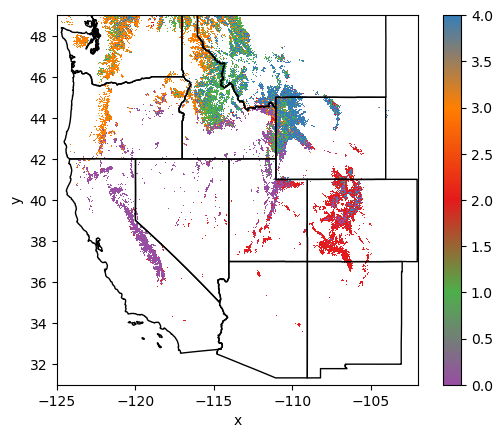

In [65]:
colors1=['#984ea3','#4daf4a','#e41a1c','#ff7f00','#377eb8'] #,'#ffff33'
cmap1 = LinearSegmentedColormap.from_list('clusters', colors1)

fig, ax = plt.subplots()
output_dataArray_5_masked.plot(cmap = plt.get_cmap(cmap1, 6), ax=ax, add_colorbar=True)
#ctx.add_basemap(ax=ax, crs='epsg:4326', source='https://mt1.google.com/vt/lyrs=s&x={x}&y={y}&z={z}', zoom=8, attribution=False)
wstates_4326.plot(ax=ax, facecolor='none',edgecolor='k')

<Axes: xlabel='x', ylabel='y'>

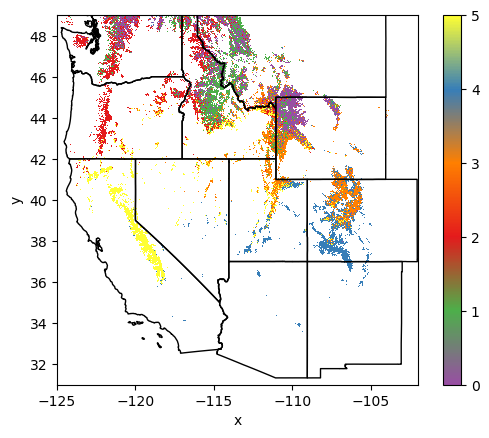

In [69]:
colors1=['#984ea3','#4daf4a','#e41a1c','#ff7f00','#377eb8','#ffff33'] #
cmap1 = LinearSegmentedColormap.from_list('clusters', colors1)

fig, ax = plt.subplots()
output_dataArray_6_masked.plot(cmap = plt.get_cmap(cmap1, 6), ax=ax, add_colorbar=True)
#ctx.add_basemap(ax=ax, crs='epsg:4326', source='https://mt1.google.com/vt/lyrs=s&x={x}&y={y}&z={z}', zoom=8, attribution=False)
wstates_4326.plot(ax=ax, facecolor='none',edgecolor='k')

#### Coarsened x2:

In [20]:
reanalysis_snv_coarser = reanalysis_snv.coarsen(x=2, boundary='trim').mean().coarsen(y=2, boundary='trim').mean()

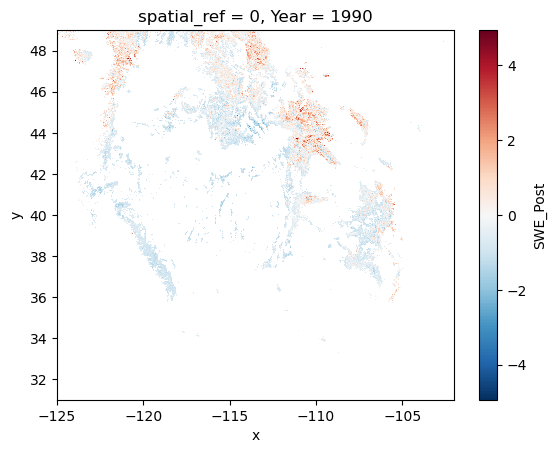

In [21]:
reanalysis_snv_coarser[0].plot()

In [23]:
# Get into non nan space:
x_arr = reanalysis_snv_coarser.x.values
y_arr = reanalysis_snv_coarser.y.values
anol_arr = reanalysis_snv_coarser.values

anol_flat = reanalysis_snv_coarser[0].values.flatten()

anol_flat_3d = reanalysis_snv_coarser.values.flatten()

y_nonnan = y_arr[np.argwhere(~np.isnan(anol_arr[0,:,:]))[:,0]]
x_nonnan = x_arr[np.argwhere(~np.isnan(anol_arr[0,:,:]))[:,1]]

anol_nonnan = anol_arr[~np.isnan(anol_arr)].reshape(32,x_nonnan.shape[0])

In [24]:
n_clusters_kmeans = 5
kmeans_5 = KMeans(n_clusters = n_clusters_kmeans, init = 'k-means++', max_iter = 300, n_init = 10, random_state = 0)
clusters_5 = kmeans_5.fit_predict(anol_nonnan.T)

In [25]:
# Get back to nan space:

output_flat = np.ones((reanalysis_snv_coarser.shape[1]*reanalysis_snv_coarser.shape[2])) * -1

output_flat[np.argwhere(~np.isnan(anol_flat)).reshape(clusters_5.shape[0])] = clusters_5

output_reshaped = output_flat.reshape(
    reanalysis_snv_coarser.shape[1], reanalysis_snv_coarser.shape[2]
)

output_reshaped = output_reshaped.astype(int)

output_dataArray_5 = xr.DataArray(data = output_reshaped,
                           dims=("y","x"),
                           coords=[reanalysis_snv_coarser.y,reanalysis_snv_coarser.x])
output_dataArray_5_masked = output_dataArray_5.where(output_dataArray_5!=-1)

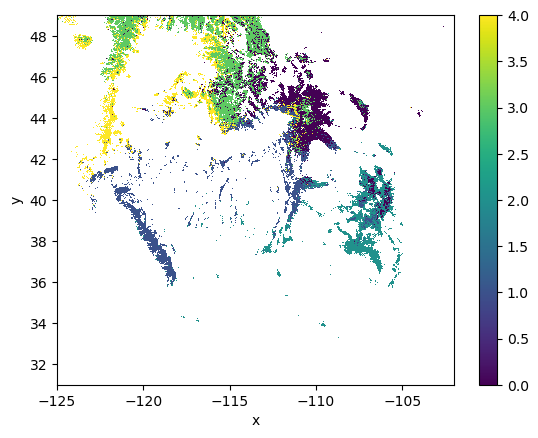

In [26]:
output_dataArray_5_masked.plot()

#### Coarsened x3:

In [27]:
reanalysis_snv_coarser = reanalysis_snv.coarsen(x=3, boundary='trim').mean().coarsen(y=3, boundary='trim').mean()

In [28]:
# Get into non nan space:
x_arr = reanalysis_snv_coarser.x.values
y_arr = reanalysis_snv_coarser.y.values
anol_arr = reanalysis_snv_coarser.values

anol_flat = reanalysis_snv_coarser[0].values.flatten()

anol_flat_3d = reanalysis_snv_coarser.values.flatten()

y_nonnan = y_arr[np.argwhere(~np.isnan(anol_arr[0,:,:]))[:,0]]
x_nonnan = x_arr[np.argwhere(~np.isnan(anol_arr[0,:,:]))[:,1]]

anol_nonnan = anol_arr[~np.isnan(anol_arr)].reshape(32,x_nonnan.shape[0])

In [29]:
n_clusters_kmeans = 5
kmeans_5 = KMeans(n_clusters = n_clusters_kmeans, init = 'k-means++', max_iter = 300, n_init = 10, random_state = 0)
clusters_5 = kmeans_5.fit_predict(anol_nonnan.T)

In [30]:
# Get back to nan space:

output_flat = np.ones((reanalysis_snv_coarser.shape[1]*reanalysis_snv_coarser.shape[2])) * -1

output_flat[np.argwhere(~np.isnan(anol_flat)).reshape(clusters_5.shape[0])] = clusters_5

output_reshaped = output_flat.reshape(
    reanalysis_snv_coarser.shape[1], reanalysis_snv_coarser.shape[2]
)

output_reshaped = output_reshaped.astype(int)

output_dataArray_5 = xr.DataArray(data = output_reshaped,
                           dims=("y","x"),
                           coords=[reanalysis_snv_coarser.y,reanalysis_snv_coarser.x])
output_dataArray_5_masked = output_dataArray_5.where(output_dataArray_5!=-1)

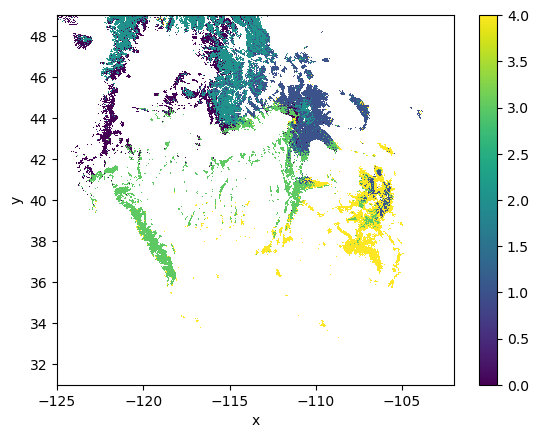

In [31]:
output_dataArray_5_masked.plot()

#### Coarsened x4:

In [32]:
reanalysis_snv_coarser = reanalysis_snv.coarsen(x=4, boundary='trim').mean().coarsen(y=4, boundary='trim').mean()

In [33]:
# Get into non nan space:
x_arr = reanalysis_snv_coarser.x.values
y_arr = reanalysis_snv_coarser.y.values
anol_arr = reanalysis_snv_coarser.values

anol_flat = reanalysis_snv_coarser[0].values.flatten()

anol_flat_3d = reanalysis_snv_coarser.values.flatten()

y_nonnan = y_arr[np.argwhere(~np.isnan(anol_arr[0,:,:]))[:,0]]
x_nonnan = x_arr[np.argwhere(~np.isnan(anol_arr[0,:,:]))[:,1]]

anol_nonnan = anol_arr[~np.isnan(anol_arr)].reshape(32,x_nonnan.shape[0])

In [34]:
n_clusters_kmeans = 5
kmeans_5 = KMeans(n_clusters = n_clusters_kmeans, init = 'k-means++', max_iter = 300, n_init = 10, random_state = 0)
clusters_5 = kmeans_5.fit_predict(anol_nonnan.T)

In [35]:
# Get back to nan space:

output_flat = np.ones((reanalysis_snv_coarser.shape[1]*reanalysis_snv_coarser.shape[2])) * -1

output_flat[np.argwhere(~np.isnan(anol_flat)).reshape(clusters_5.shape[0])] = clusters_5

output_reshaped = output_flat.reshape(
    reanalysis_snv_coarser.shape[1], reanalysis_snv_coarser.shape[2]
)

output_reshaped = output_reshaped.astype(int)

output_dataArray_5 = xr.DataArray(data = output_reshaped,
                           dims=("y","x"),
                           coords=[reanalysis_snv_coarser.y,reanalysis_snv_coarser.x])
output_dataArray_5_masked = output_dataArray_5.where(output_dataArray_5!=-1)

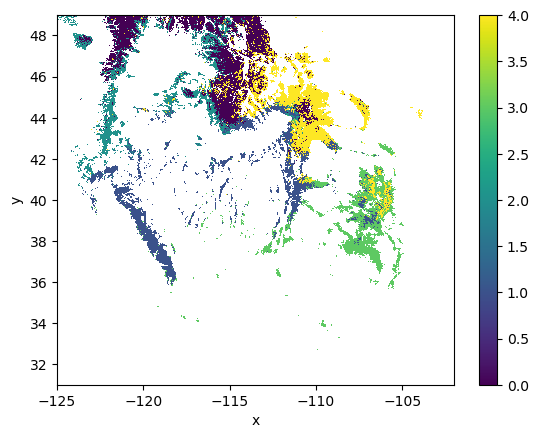

In [36]:
output_dataArray_5_masked.plot()

#### Coarsened x5:

In [37]:
reanalysis_snv_coarser = reanalysis_snv.coarsen(x=5, boundary='trim').mean().coarsen(y=5, boundary='trim').mean()

In [38]:
# Get into non nan space:
x_arr = reanalysis_snv_coarser.x.values
y_arr = reanalysis_snv_coarser.y.values
anol_arr = reanalysis_snv_coarser.values

anol_flat = reanalysis_snv_coarser[0].values.flatten()

anol_flat_3d = reanalysis_snv_coarser.values.flatten()

y_nonnan = y_arr[np.argwhere(~np.isnan(anol_arr[0,:,:]))[:,0]]
x_nonnan = x_arr[np.argwhere(~np.isnan(anol_arr[0,:,:]))[:,1]]

anol_nonnan = anol_arr[~np.isnan(anol_arr)].reshape(32,x_nonnan.shape[0])

In [39]:
n_clusters_kmeans = 5
kmeans_5 = KMeans(n_clusters = n_clusters_kmeans, init = 'k-means++', max_iter = 300, n_init = 10, random_state = 0)
clusters_5 = kmeans_5.fit_predict(anol_nonnan.T)

In [40]:
# Get back to nan space:

output_flat = np.ones((reanalysis_snv_coarser.shape[1]*reanalysis_snv_coarser.shape[2])) * -1

output_flat[np.argwhere(~np.isnan(anol_flat)).reshape(clusters_5.shape[0])] = clusters_5

output_reshaped = output_flat.reshape(
    reanalysis_snv_coarser.shape[1], reanalysis_snv_coarser.shape[2]
)

output_reshaped = output_reshaped.astype(int)

output_dataArray_5 = xr.DataArray(data = output_reshaped,
                           dims=("y","x"),
                           coords=[reanalysis_snv_coarser.y,reanalysis_snv_coarser.x])
output_dataArray_5_masked = output_dataArray_5.where(output_dataArray_5!=-1)

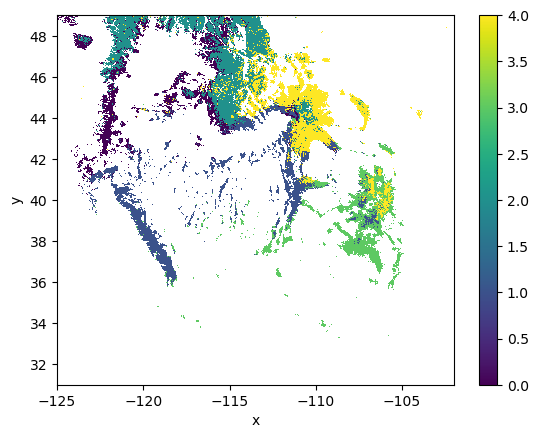

In [41]:
output_dataArray_5_masked.plot()

#### Coarsened x6:

In [42]:
reanalysis_snv_coarser = reanalysis_snv.coarsen(x=6, boundary='trim').mean().coarsen(y=6, boundary='trim').mean()

In [43]:
# Get into non nan space:
x_arr = reanalysis_snv_coarser.x.values
y_arr = reanalysis_snv_coarser.y.values
anol_arr = reanalysis_snv_coarser.values

anol_flat = reanalysis_snv_coarser[0].values.flatten()

anol_flat_3d = reanalysis_snv_coarser.values.flatten()

y_nonnan = y_arr[np.argwhere(~np.isnan(anol_arr[0,:,:]))[:,0]]
x_nonnan = x_arr[np.argwhere(~np.isnan(anol_arr[0,:,:]))[:,1]]

anol_nonnan = anol_arr[~np.isnan(anol_arr)].reshape(32,x_nonnan.shape[0])

In [44]:
n_clusters_kmeans = 5
kmeans_5 = KMeans(n_clusters = n_clusters_kmeans, init = 'k-means++', max_iter = 300, n_init = 10, random_state = 0)
clusters_5 = kmeans_5.fit_predict(anol_nonnan.T)

In [45]:
# Get back to nan space:

output_flat = np.ones((reanalysis_snv_coarser.shape[1]*reanalysis_snv_coarser.shape[2])) * -1

output_flat[np.argwhere(~np.isnan(anol_flat)).reshape(clusters_5.shape[0])] = clusters_5

output_reshaped = output_flat.reshape(
    reanalysis_snv_coarser.shape[1], reanalysis_snv_coarser.shape[2]
)

output_reshaped = output_reshaped.astype(int)

output_dataArray_5 = xr.DataArray(data = output_reshaped,
                           dims=("y","x"),
                           coords=[reanalysis_snv_coarser.y,reanalysis_snv_coarser.x])
output_dataArray_5_masked = output_dataArray_5.where(output_dataArray_5!=-1)

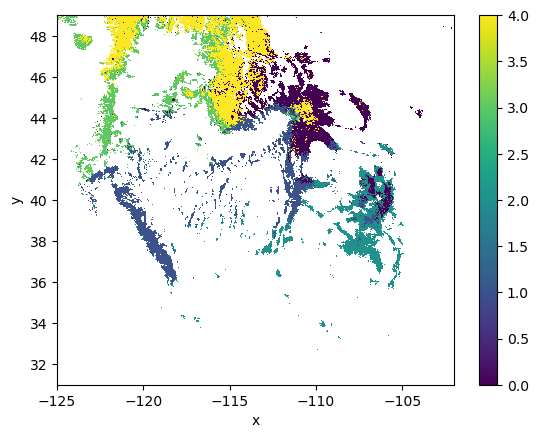

In [46]:
output_dataArray_5_masked.plot()

#### Coarsened x7:

In [47]:
reanalysis_snv_coarser = reanalysis_snv.coarsen(x=7, boundary='trim').mean().coarsen(y=7, boundary='trim').mean()

In [48]:
# Get into non nan space:
x_arr = reanalysis_snv_coarser.x.values
y_arr = reanalysis_snv_coarser.y.values
anol_arr = reanalysis_snv_coarser.values

anol_flat = reanalysis_snv_coarser[0].values.flatten()

anol_flat_3d = reanalysis_snv_coarser.values.flatten()

y_nonnan = y_arr[np.argwhere(~np.isnan(anol_arr[0,:,:]))[:,0]]
x_nonnan = x_arr[np.argwhere(~np.isnan(anol_arr[0,:,:]))[:,1]]

anol_nonnan = anol_arr[~np.isnan(anol_arr)].reshape(32,x_nonnan.shape[0])

In [49]:
n_clusters_kmeans = 5
kmeans_5 = KMeans(n_clusters = n_clusters_kmeans, init = 'k-means++', max_iter = 300, n_init = 10, random_state = 0)
clusters_5 = kmeans_5.fit_predict(anol_nonnan.T)

In [50]:
# Get back to nan space:

output_flat = np.ones((reanalysis_snv_coarser.shape[1]*reanalysis_snv_coarser.shape[2])) * -1

output_flat[np.argwhere(~np.isnan(anol_flat)).reshape(clusters_5.shape[0])] = clusters_5

output_reshaped = output_flat.reshape(
    reanalysis_snv_coarser.shape[1], reanalysis_snv_coarser.shape[2]
)

output_reshaped = output_reshaped.astype(int)

output_dataArray_5 = xr.DataArray(data = output_reshaped,
                           dims=("y","x"),
                           coords=[reanalysis_snv_coarser.y,reanalysis_snv_coarser.x])
output_dataArray_5_masked = output_dataArray_5.where(output_dataArray_5!=-1)

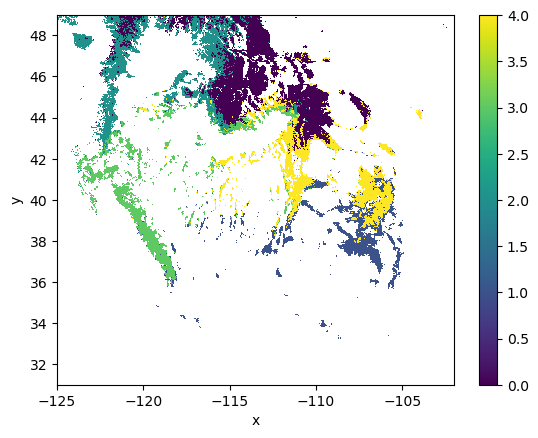

In [51]:
output_dataArray_5_masked.plot()

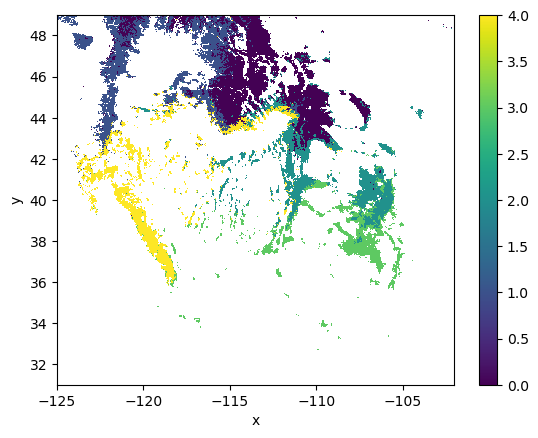

In [56]:
# coarsened by x8
output_dataArray_5_masked.plot()

#### Coarsened x8:

In [7]:
reanalysis_snv_coarser = reanalysis_snv.coarsen(x=8, boundary='trim').mean().coarsen(y=8, boundary='trim').mean()

In [8]:
# Get into non nan space:
x_arr = reanalysis_snv_coarser.x.values
y_arr = reanalysis_snv_coarser.y.values
anol_arr = reanalysis_snv_coarser.values

anol_flat = reanalysis_snv_coarser[0].values.flatten()

anol_flat_3d = reanalysis_snv_coarser.values.flatten()

y_nonnan = y_arr[np.argwhere(~np.isnan(anol_arr[0,:,:]))[:,0]]
x_nonnan = x_arr[np.argwhere(~np.isnan(anol_arr[0,:,:]))[:,1]]

anol_nonnan = anol_arr[~np.isnan(anol_arr)].reshape(32,x_nonnan.shape[0])

In [54]:
n_clusters_kmeans = 5
kmeans_5 = KMeans(n_clusters = n_clusters_kmeans, init = 'k-means++', max_iter = 300, n_init = 10, random_state = 0)
clusters_5 = kmeans_5.fit_predict(anol_nonnan.T)

In [55]:
# Get back to nan space:

output_flat = np.ones((reanalysis_snv_coarser.shape[1]*reanalysis_snv_coarser.shape[2])) * -1

output_flat[np.argwhere(~np.isnan(anol_flat)).reshape(clusters_5.shape[0])] = clusters_5

output_reshaped = output_flat.reshape(
    reanalysis_snv_coarser.shape[1], reanalysis_snv_coarser.shape[2]
)

output_reshaped = output_reshaped.astype(int)

output_dataArray_5 = xr.DataArray(data = output_reshaped,
                           dims=("y","x"),
                           coords=[reanalysis_snv_coarser.y,reanalysis_snv_coarser.x])
output_dataArray_5_masked = output_dataArray_5.where(output_dataArray_5!=-1)

### Cluster the Reanalysis only at Snotel Locations:

In [85]:
df_snv = pickle.load(open('../data/snv_dataframes/snv_temp_precip_cluster_gdf_snvs.pkl','rb'))

In [86]:
df_snv.columns

Index(['station_n', 'reanalysis_n', 'elevation_m', 'station_swe',
       'station_swe_mean', 'reanalysis_swe', 'deg_days_0C', 'cold_deg_days',
       'cumulative_precip_m', 'precip_mean', 'precip_std', 'precip_n',
       'log_cumulative_precip_m', 'log_reanalysis_swe', 'log_station_swe',
       'log_precip_mean', 'log_station_swe_mean', 'log_reanalysis_swe_mean',
       'log_precip_std', 'log_station_swe_std', 'log_reanalysis_swe_std',
       'log_precip_n', 'log_station_n', 'log_reanalysis_n', 'latitude',
       'longitude', 'geometry', 'cluster', 'sampled_reanalysis_cluster'],
      dtype='object')

In [87]:
df_snv['reanalysis_n'].unstack(level=-1)

year,1990,1991,1992,1993,1994,1995,1996,1997,1998,1999,...,2012,2013,2014,2015,2016,2017,2018,2019,2020,2021
station,,,,,,,,,,,,,,,,,,,,,
301_CA_SNTL,-0.194751,0.193222,-1.097426,-0.578276,-0.422643,0.956939,-0.373729,0.104288,-0.245887,0.567854,...,-0.965137,-0.920670,-1.065187,-1.149674,-0.152507,0.833543,-0.958467,0.812422,0.714595,0.995847
302_OR_SNTL,-0.241826,-0.315873,-1.706427,-0.309142,0.150529,1.596859,0.152453,1.671868,-0.704382,0.647705,...,1.453573,1.421838,0.131296,-1.382349,0.736177,-0.092770,-0.867864,0.171686,1.156421,-0.087000
304_OR_SNTL,-0.692514,0.367762,-1.179170,1.210632,-0.652377,-0.804562,-0.889852,-1.088863,-0.316233,1.180529,...,-0.904904,0.856091,-0.665756,-0.891525,-0.204185,-0.180772,-0.955074,1.489916,0.725647,-1.065450
306_ID_SNTL,-0.423763,-0.331219,-0.979028,-1.765652,-0.451889,0.779309,-0.617017,2.066760,0.343808,0.754812,...,0.752091,0.267595,0.785660,-1.431767,1.270156,1.579543,-1.975237,0.939900,-0.167906,0.788382
309_WY_SNTL,0.241531,-0.951903,-0.188183,-1.338646,0.087224,-1.049566,0.350913,1.141978,1.823661,-1.748828,...,0.425136,-0.559300,2.237750,-1.166760,-0.602272,-0.578833,0.559910,-0.217482,2.116649,0.071598
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
CRL,-0.832593,0.356995,-0.239417,1.843403,-0.994873,1.312179,0.833663,0.674157,1.389852,-0.635639,...,-0.915351,-1.136348,-1.417447,-1.721664,-0.562127,1.952051,-0.420653,1.216476,-0.852474,-0.792832
CSV,-0.960252,-0.031729,0.099189,1.072538,0.319758,0.272798,0.790067,1.199898,2.035925,-0.977328,...,-0.253009,-1.259799,-1.098997,-1.374352,-0.768855,0.967945,-1.181533,2.047309,-0.990136,-0.763163
CAP,-0.627840,-0.093013,-0.736909,2.732266,-0.709780,1.437277,0.771789,0.153361,-0.054258,0.821618,...,-1.461084,-0.831030,-1.018717,-1.602265,-0.067545,1.645450,-0.922382,1.360873,-0.141734,-0.793935


In [88]:
# Convert to an array for use in the svd function
reanalysis_snv_station_array = df_snv['reanalysis_n'].unstack(level=-1).to_numpy()

In [89]:
reanalysis_snv_station_array.shape

(445, 32)

In [90]:
# Continued code from https://www.kaggle.com/code/ignacioalorre/clustering-features-based-on-correlation-and-tags

# Using kmeans to cluster the features based on their correlation
n_clusters_kmeans = 5
kmeans = KMeans(n_clusters = n_clusters_kmeans, init = 'k-means++', max_iter = 300, n_init = 10, random_state = 0)
anom_labels = kmeans.fit_predict(reanalysis_snv_station_array)
feat_names = df_snv['reanalysis_n'].unstack(level=-1).T.columns
# Preparing a dataframe to collect some cluster stats
anom_clust_df = pd.DataFrame(np.c_[feat_names, anom_labels])
anom_clust_df.columns = ["feature", "cluster"]
anom_clust_df['feat_list'] = anom_clust_df.groupby(["cluster"]).transform(lambda x: ', '.join(x))
anom_clust_df = anom_clust_df.groupby(["cluster", "feat_list"]).size().reset_index(name = 'feat_count')
anom_clust_df

,cluster,feat_list,feat_count
0,0,"316_NM_SNTL, 327_CO_SNTL, 334_NV_SNTL, 348_UT_...",64
1,1,"302_OR_SNTL, 312_ID_SNTL, 314_WY_SNTL, 326_WY_...",101
2,2,"304_OR_SNTL, 318_MT_SNTL, 319_ID_SNTL, 323_ID_...",87
3,3,"309_WY_SNTL, 311_MT_SNTL, 313_MT_SNTL, 317_WY_...",68
4,4,"301_CA_SNTL, 306_ID_SNTL, 320_ID_SNTL, 329_UT_...",125


In [91]:
# Continued code from https://www.kaggle.com/code/ignacioalorre/clustering-features-based-on-correlation-and-tags

anom_node_dist = kmeans.transform(reanalysis_snv_station_array)
anom_clust_dist = np.c_[feat_names, np.round(anom_node_dist.min(axis=1),3), np.round(anom_node_dist.min(axis=1)/np.max(anom_node_dist.min(axis=1)),3), anom_labels]
anom_clust_dist_df = pd.DataFrame(anom_clust_dist)
anom_clust_dist_df.columns = ['feature', 'dist_anom', 'dist_anom_norm', 'cluster_anom']
anom_clust_dist_df

,feature,dist_anom,dist_anom_norm,cluster_anom
0,301_CA_SNTL,4.439,0.756,4
1,302_OR_SNTL,4.642,0.791,1
2,304_OR_SNTL,4.853,0.827,2
3,306_ID_SNTL,5.137,0.875,4
4,309_WY_SNTL,4.903,0.836,3
...,...,...,...,...
440,CRL,3.041,0.518,4
441,CSV,3.607,0.615,4
442,CAP,3.046,0.519,4
443,HHM,2.764,0.471,4


In [92]:
df_snv_1yr = df_snv[df_snv.index.get_level_values(1)==1990]

In [93]:
df_snv_1yr['reanalysis_cluster'] = anom_clust_dist_df['cluster_anom'].values

/Users/Hannah/micromamba/envs/analysis_2024/lib/python3.12/site-packages/geopandas/geodataframe.py:1528: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  super().__setitem__(key, value)


/var/folders/yr/1f67jccn6hl_lyxnqy7qjpq40000gp/T/ipykernel_3111/1495653152.py:7: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap(obj)`` instead.
  df_snv_1yr.plot(column='reanalysis_cluster', ax=ax[0], cmap = plt.cm.get_cmap(cmap, 6), legend=True)
/var/folders/yr/1f67jccn6hl_lyxnqy7qjpq40000gp/T/ipykernel_3111/1495653152.py:14: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap(obj)`` instead.
  df_snv_1yr.plot(column='cluster', ax=ax[1], cmap = plt.cm.get_cmap(cmap1, 6), legend=True)


Text(0.5, 1.0, 'Snotel stations')

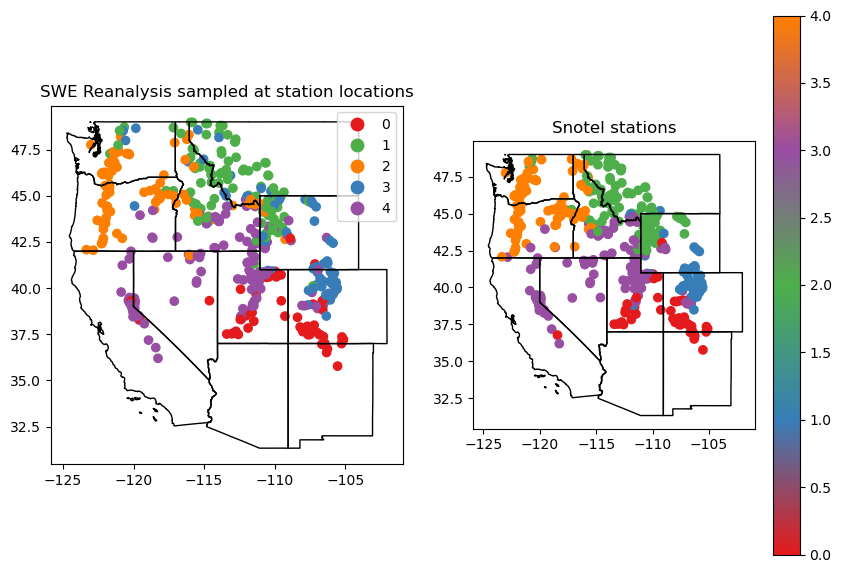

In [100]:
fig, ax = plt.subplots(1,2, figsize=(10,7))

from matplotlib.colors import LinearSegmentedColormap
colors=['#e41a1c','#4daf4a','#ff7f00','#377eb8','#984ea3'] #,'#ffff33'
cmap = LinearSegmentedColormap.from_list('clusters', colors)

df_snv_1yr.plot(column='reanalysis_cluster', ax=ax[0], cmap = plt.cm.get_cmap(cmap, 6), legend=True)
wstates_4326.plot(ax=ax[0], facecolor='none', edgecolor='k')
ax[0].set_title('SWE Reanalysis sampled at station locations')

colors1=['#e41a1c','#377eb8','#4daf4a','#984ea3','#ff7f00'] #,'#ffff33'
cmap1 = LinearSegmentedColormap.from_list('clusters', colors1)

df_snv_1yr.plot(column='cluster', ax=ax[1], cmap = plt.cm.get_cmap(cmap1, 6), legend=True)
wstates_4326.plot(ax=ax[1], facecolor='none', edgecolor='k')
ax[1].set_title('Snotel stations')

In [107]:
target_colors = {'red':0, 'blue':1, 'green':2, 'purple':3, 'orange':4}
reanalysis_colors = {'red':0, 'green':1, 'orange':2, 'blue':3, 'purple':4}
swe_to_snotel = {-1:-1, 0:0, 3:1, 1:2, 4:3, 2:4}

In [108]:
df_snv_1yr['reanalysis_cluster_conv'] = ''

for i in df_snv_1yr.index:
    if df_snv_1yr.loc[i,'reanalysis_cluster'] in swe_to_snotel.keys():
        df_snv_1yr.loc[i,'reanalysis_cluster_conv'] = swe_to_snotel[int(df_snv_1yr.loc[i,'reanalysis_cluster'])]
    else:
        df_snv_1yr.loc[i,'reanalysis_cluster_conv'] = np.nan

/Users/Hannah/micromamba/envs/analysis_2024/lib/python3.12/site-packages/geopandas/geodataframe.py:1528: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  super().__setitem__(key, value)


/var/folders/yr/1f67jccn6hl_lyxnqy7qjpq40000gp/T/ipykernel_3111/1618027348.py:7: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap(obj)`` instead.
  df_snv_1yr.plot(column='reanalysis_cluster_conv', ax=ax[0], cmap = plt.cm.get_cmap(cmap1, 6), legend=True)
/var/folders/yr/1f67jccn6hl_lyxnqy7qjpq40000gp/T/ipykernel_3111/1618027348.py:13: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap(obj)`` instead.
  df_snv_1yr.plot(column='cluster', ax=ax[1], cmap = plt.cm.get_cmap(cmap1, 6), legend=True)


Text(0.5, 1.0, 'Snotel stations')

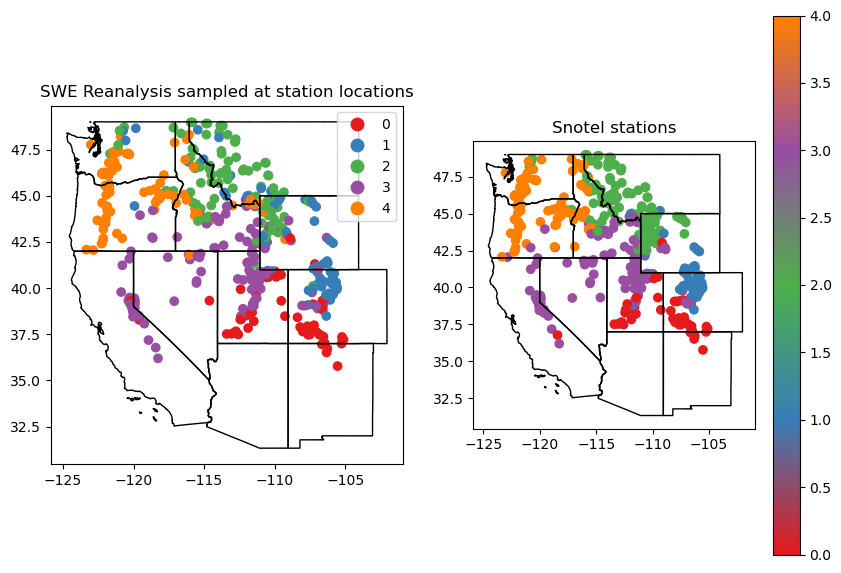

In [109]:
fig, ax = plt.subplots(1,2, figsize=(10,7))

from matplotlib.colors import LinearSegmentedColormap
colors1=['#e41a1c','#377eb8','#4daf4a','#984ea3','#ff7f00'] #,'#ffff33'
cmap1 = LinearSegmentedColormap.from_list('clusters', colors1)

df_snv_1yr.plot(column='reanalysis_cluster_conv', ax=ax[0], cmap = plt.cm.get_cmap(cmap1, 6), legend=True)
wstates_4326.plot(ax=ax[0], facecolor='none', edgecolor='k')
ax[0].set_title('SWE Reanalysis sampled at station locations')



df_snv_1yr.plot(column='cluster', ax=ax[1], cmap = plt.cm.get_cmap(cmap1, 6), legend=True)
wstates_4326.plot(ax=ax[1], facecolor='none', edgecolor='k')
ax[1].set_title('Snotel stations')

In [113]:
df_snv_1yr = df_snv_1yr.drop(columns=['reanalysis_cluster'])

In [115]:
df_snv_1yr = df_snv_1yr.rename(columns={'reanalysis_cluster_conv':'reanalysis_cluster'})

In [117]:
df_snv_1yr.loc[df_snv_1yr.index.get_level_values(0)==site, 'reanalysis_cluster'].values

array([3], dtype=object)

In [123]:
df_snv_1yr['agree'] = 0

for i in df_snv_1yr.index:
    if df_snv_1yr.loc[i,'cluster'] == df_snv_1yr.loc[i,'reanalysis_cluster']:
        df_snv_1yr.loc[i,'agree'] = 1
    else:
        df_snv_1yr.loc[i,'agree'] = 0

In [124]:
df_snv_1yr['agree'].sum() / len(df_snv_1yr['agree']) * 100

77.30337078651685

### Save new dataframe with limited cluster reanalysis:

In [118]:
df_snv['reanalysis_cluster'] = np.nan
for site in df_snv_1yr.index.get_level_values(0):
    for year in range(1990,2022):
        df_snv.loc[pd.IndexSlice[site, year], 'reanalysis_cluster'] = df_snv_1yr.loc[df_snv_1yr.index.get_level_values(0)==site, 'reanalysis_cluster'].values

In [122]:
df_snv.to_pickle('../data/snv_dataframes/snv_temp_precip_cluster_gdf_snvs.pkl')

/var/folders/yr/1f67jccn6hl_lyxnqy7qjpq40000gp/T/ipykernel_2296/3699211695.py:7: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap(obj)`` instead.
  output_dataArray_5_masked.plot(cmap = plt.cm.get_cmap(cmap, 6), ax=ax, add_colorbar=False)


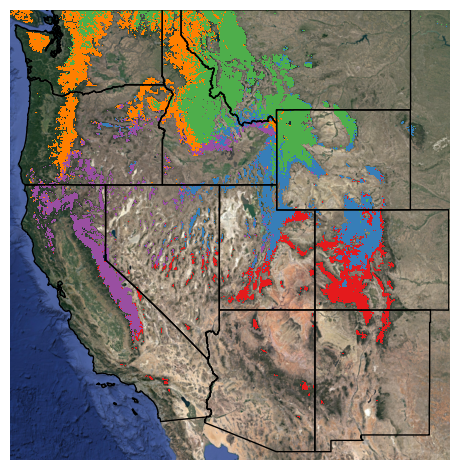

In [34]:
from matplotlib.colors import LinearSegmentedColormap
colors=['#e41a1c','#377eb8','#4daf4a','#984ea3','#ff7f00'] #,'#ffff33'
cmap = LinearSegmentedColormap.from_list('clusters', colors)
#cmap.set_bad('white',alpha=0)

fig, ax = plt.subplots()

output_dataArray_5_masked.plot(cmap = plt.cm.get_cmap(cmap, 6), ax=ax, add_colorbar=False)
ctx.add_basemap(ax=ax, crs='epsg:4326', source='https://mt1.google.com/vt/lyrs=s&x={x}&y={y}&z={z}', zoom=8, attribution=False)
wstates_4326.plot(ax=ax, facecolor='none',edgecolor='k')

plt.axis('off')
plt.tight_layout()
plt.savefig('../figures/Clusters5_nan_reanalysis_terrain.jpeg',dpi=300)

In [21]:
output_dataArray_5_masked.to_netcdf('../data/swe_reanalysis_5clusters_highres.nc')

/var/folders/yr/1f67jccn6hl_lyxnqy7qjpq40000gp/T/ipykernel_821/1383154550.py:7: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap(obj)`` instead.
  output_dataArray_4_masked.plot(cmap = plt.cm.get_cmap(cmap, 6), ax=ax, add_colorbar=False)


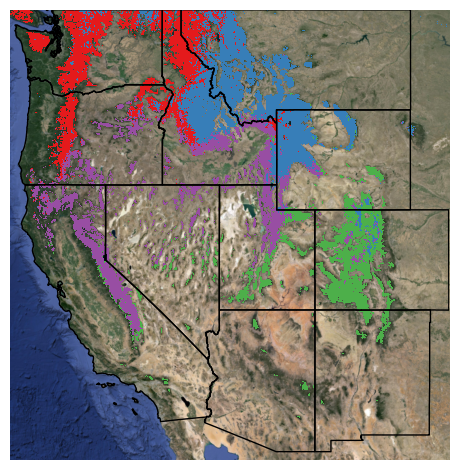

In [31]:
from matplotlib.colors import LinearSegmentedColormap
colors=['#e41a1c','#377eb8','#4daf4a','#984ea3'] #,'#ffff33'
cmap = LinearSegmentedColormap.from_list('clusters', colors)

fig, ax = plt.subplots()

output_dataArray_4_masked.plot(cmap = plt.cm.get_cmap(cmap, 6), ax=ax, add_colorbar=False)
ctx.add_basemap(ax=ax, crs='epsg:4326', source='https://mt1.google.com/vt/lyrs=s&x={x}&y={y}&z={z}', zoom=8, attribution=False)
wstates_4326.plot(ax=ax, facecolor='none',edgecolor='k')

plt.axis('off')
plt.tight_layout()

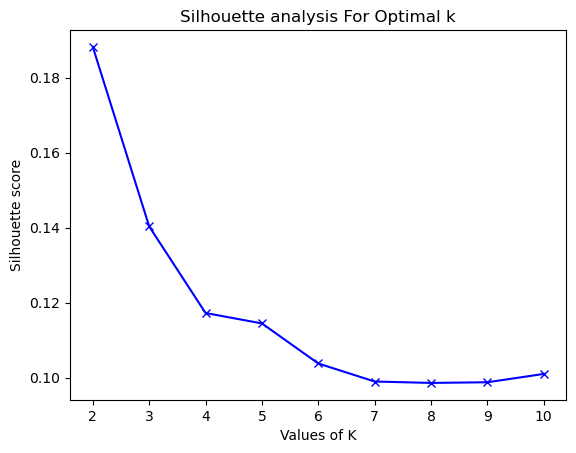

<Figure size 640x480 with 0 Axes>

In [9]:
range_n_clusters = [2,3, 4, 5, 6, 7, 8,9,10]
silhouette_avg = []
for num_clusters in range_n_clusters:
    # initialise kmeans
    kmeans = KMeans(n_clusters=num_clusters, init='k-means++', n_init=10)
    kmeans.fit_predict(anol_nonnan.T)
    cluster_labels = kmeans.labels_
    # silhouette score
    silhouette_avg.append(sklearn.metrics.silhouette_score(anol_nonnan.T, cluster_labels))

fig, ax = plt.subplots()

plt.plot(range_n_clusters,silhouette_avg,'bx-')
plt.xlabel('Values of K') 
plt.ylabel('Silhouette score') 
plt.title('Silhouette analysis For Optimal k')
plt.show()
plt.tight_layout()
#plt.savefig('../figures/silhuette_analysis.jpeg',dpi=300)

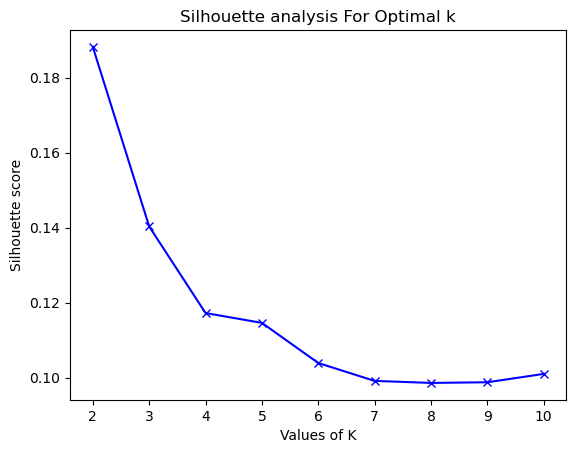

<Figure size 640x480 with 0 Axes>

In [29]:
range_n_clusters = [2,3, 4, 5, 6, 7, 8,9,10]
silhouette_avg = []
for num_clusters in range_n_clusters:
    # initialise kmeans
    kmeans = KMeans(n_clusters=num_clusters, init='k-means++', n_init=10)
    kmeans.fit_predict(anol_nonnan.T)
    cluster_labels = kmeans.labels_
    # silhouette score
    silhouette_avg.append(sklearn.metrics.silhouette_score(anol_nonnan.T, cluster_labels))

fig, ax = plt.subplots()

plt.plot(range_n_clusters,silhouette_avg,'bx-')
plt.xlabel('Values of K') 
plt.ylabel('Silhouette score') 
plt.title('Silhouette analysis For Optimal k')
plt.show()
plt.tight_layout()

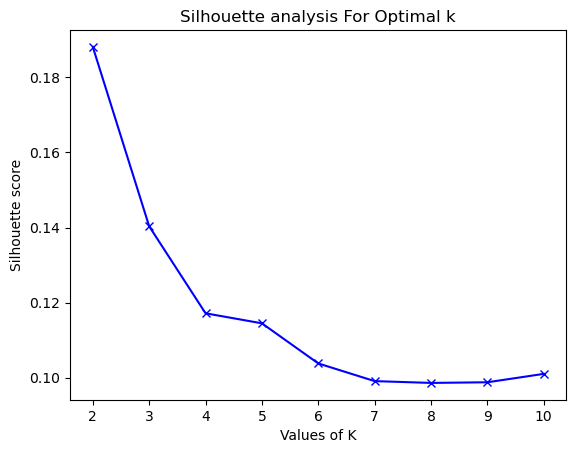

<Figure size 640x480 with 0 Axes>

In [30]:
range_n_clusters = [2,3, 4, 5, 6, 7, 8,9,10]
silhouette_avg = []
for num_clusters in range_n_clusters:
    # initialise kmeans
    kmeans = KMeans(n_clusters=num_clusters, init='k-means++', n_init=30)
    kmeans.fit_predict(anol_nonnan.T)
    cluster_labels = kmeans.labels_
    # silhouette score
    silhouette_avg.append(sklearn.metrics.silhouette_score(anol_nonnan.T, cluster_labels))

fig, ax = plt.subplots()

plt.plot(range_n_clusters,silhouette_avg,'bx-')
plt.xlabel('Values of K') 
plt.ylabel('Silhouette score') 
plt.title('Silhouette analysis For Optimal k')
plt.show()
plt.tight_layout()

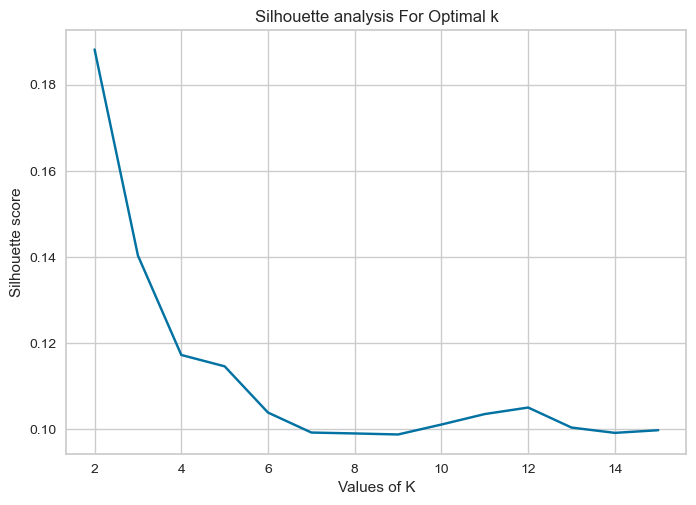

<Figure size 800x550 with 0 Axes>

In [10]:
range_n_clusters = [2,3, 4, 5, 6, 7, 8,9,10,11,12,13,14,15]
silhouette_avg = []
for num_clusters in range_n_clusters:
    # initialise kmeans
    kmeans = KMeans(n_clusters=num_clusters, init='k-means++', n_init=30)
    kmeans.fit_predict(anol_nonnan.T)
    cluster_labels = kmeans.labels_
    # silhouette score
    silhouette_avg.append(sklearn.metrics.silhouette_score(anol_nonnan.T, cluster_labels))

fig, ax = plt.subplots()

plt.plot(range_n_clusters,silhouette_avg,'bx-')
plt.xlabel('Values of K') 
plt.ylabel('Silhouette score') 
plt.title('Silhouette analysis For Optimal k')
plt.show()
plt.tight_layout()

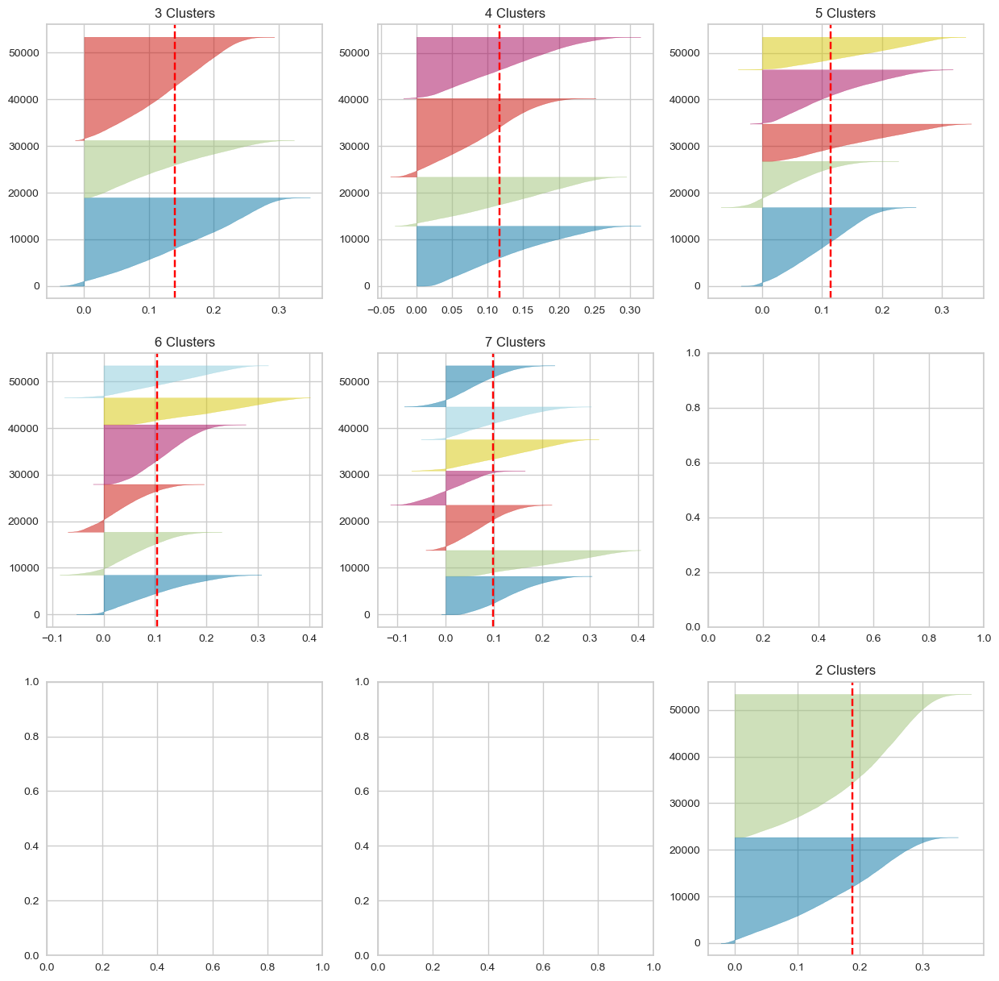

In [9]:
from yellowbrick.cluster import SilhouetteVisualizer
  
fig, ax = plt.subplots(3, 3, figsize=(15,15))
for i in [2, 3, 4, 5, 6, 7]:
    '''
    Create KMeans instances for different number of clusters
    '''
    km = KMeans(n_clusters=i, init='k-means++', n_init=10, max_iter=300)
    q, mod = divmod(i, 3)
    '''
    Create SilhouetteVisualizer instance with KMeans instance
    Fit the visualizer
    '''
    visualizer = SilhouetteVisualizer(km, colors='yellowbrick', ax=ax[q-1][mod])
    visualizer.fit(anol_nonnan.T) 
    ax[q-1][mod].set_title('{} Clusters'.format(i))

In [16]:
anol_nonnan[0]

array([-0.5667592 , -0.6397687 , -0.55978966, ...,  0.05885448,
       -0.5022953 , -0.5347786 ], dtype=float32)

In [20]:
df = pd.DataFrame(anol_nonnan.T)

In [21]:
df

,0,1,2,3,4,5,6,7,8,9,...,22,23,24,25,26,27,28,29,30,31
0,-0.566759,-0.576604,0.282341,-0.582757,-0.624597,-0.340332,-0.624597,-0.622135,-0.527381,-0.624597,...,1.282803,-0.394478,-0.478157,0.192509,-0.144670,-0.305876,-0.544609,1.437857,1.954700,-0.619674
1,-0.639769,2.750232,0.898133,1.947441,-0.412232,0.673559,-0.643987,0.065478,0.677647,-0.524813,...,-0.392772,-0.615460,-0.636138,-0.323864,-0.635920,-0.510630,-0.641008,0.799860,0.781355,-0.440611
2,-0.559790,2.094009,1.397515,2.109957,-0.520336,1.651916,-0.677645,0.184422,1.857595,-0.573341,...,-0.268968,-0.624677,-0.672763,-0.608308,-0.646209,-0.666409,-0.675997,0.010525,0.696139,-0.516401
3,-0.635220,1.591657,1.683760,3.106942,-0.390452,1.671143,-0.577182,-0.360172,1.123571,-0.466154,...,-0.309705,-0.635220,-0.656668,-0.657930,-0.483817,-0.608724,-0.668023,0.435952,0.029689,-0.654145
4,0.205185,1.318123,2.376906,2.875900,-0.558737,0.634615,-0.716674,-0.277670,0.644663,-0.606046,...,-0.589098,-0.576779,-0.659572,-0.493698,-0.541846,0.058635,-0.647505,0.540935,1.386056,-0.262154
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
53383,0.412285,0.844193,-1.285653,1.754537,0.538240,0.243167,-0.683231,2.389367,-0.499886,-0.002532,...,-0.315126,-0.943299,0.110032,-0.905788,-1.032594,0.081019,-0.408222,0.270983,0.771231,-1.094139
53384,0.466240,0.740556,-1.321188,1.814034,0.521816,0.174935,-0.557606,2.308806,-0.442409,-0.229629,...,-0.635352,-0.954641,0.129920,-0.910220,-1.052139,0.392389,-0.303913,0.411785,0.742415,-1.085457
53385,0.058854,0.820703,-1.116650,1.590177,0.714581,0.139240,-0.337668,2.396630,-0.644750,-0.700109,...,-0.652800,-1.035583,0.450752,-0.815249,-0.901262,0.095778,-0.269155,0.231209,0.998227,-1.045577
53386,-0.502295,1.459788,-0.888860,1.271742,-0.355442,-0.771657,-0.227511,2.576854,-0.780944,-0.898487,...,-0.728671,-0.877638,0.354551,-0.767349,-0.768535,0.103746,0.048529,0.587641,1.002340,-0.901183


In [25]:
df.values

array([[-0.5667592 , -0.57660395,  0.2823414 , ...,  1.4378567 ,
         1.9547005 , -0.61967427],
       [-0.6397687 ,  2.7502322 ,  0.89813316, ...,  0.7998605 ,
         0.7813549 , -0.44061136],
       [-0.55978966,  2.0940087 ,  1.397515  , ...,  0.01052481,
         0.69613934, -0.5164006 ],
       ...,
       [ 0.05885448,  0.8207034 , -1.1166495 , ...,  0.23120919,
         0.9982272 , -1.0455766 ],
       [-0.5022953 ,  1.4597878 , -0.88885987, ...,  0.5876405 ,
         1.00234   , -0.90118295],
       [-0.5347786 , -0.41129884,  0.2130242 , ..., -0.36860022,
         0.18648179, -0.5393947 ]], dtype=float32)

In [12]:
import altair as alt

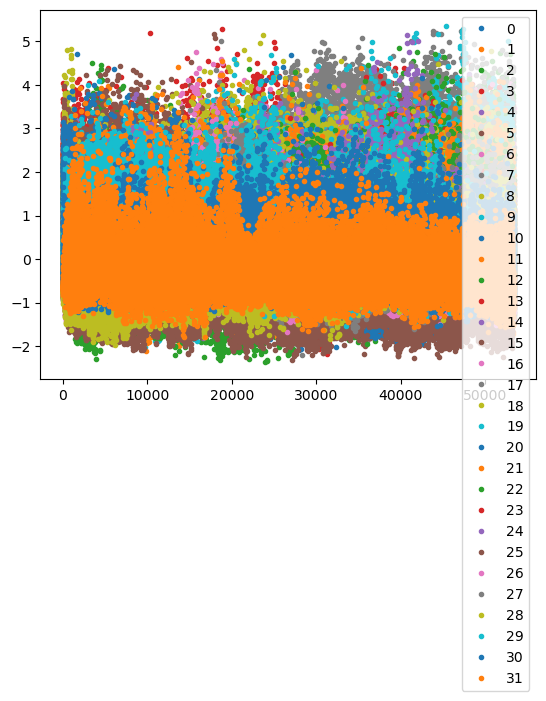

In [28]:
df.plot(linestyle='none',marker='.');

In [ ]:

alt.Chart(source).mark_circle(size=60).encode(
    x='Horsepower',
    y='Miles_per_Gallon',
    color='Origin',
    tooltip=['Name', 'Origin', 'Horsepower', 'Miles_per_Gallon']
).interactive()

/var/folders/yr/1f67jccn6hl_lyxnqy7qjpq40000gp/T/ipykernel_821/290496181.py:7: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap(obj)`` instead.
  output_dataArray_6_masked.plot(cmap = plt.cm.get_cmap(cmap, 6), ax=ax, add_colorbar=False)


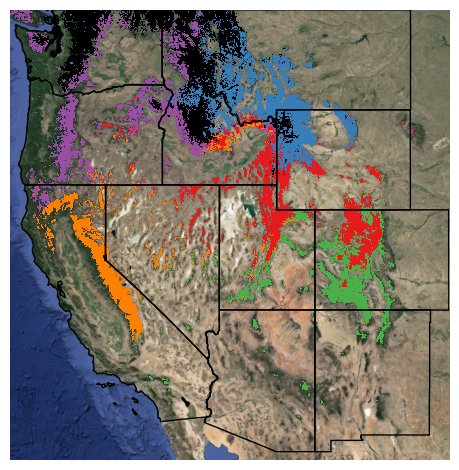

In [32]:
colors=['#e41a1c','#377eb8','#4daf4a','#984ea3','#ff7f00', '#000000'] #,'#ffff33'
cmap = LinearSegmentedColormap.from_list('clusters', colors)
#cmap.set_bad('white',alpha=0)

fig, ax = plt.subplots()

output_dataArray_6_masked.plot(cmap = plt.cm.get_cmap(cmap, 6), ax=ax, add_colorbar=False)
ctx.add_basemap(ax=ax, crs='epsg:4326', source='https://mt1.google.com/vt/lyrs=s&x={x}&y={y}&z={z}', zoom=8, attribution=False)
wstates_4326.plot(ax=ax, facecolor='none',edgecolor='k')

plt.axis('off')
plt.tight_layout()

In [ ]:
# output_dataArray_5_masked.to_netcdf('../data/clusters_5_masked.nc')

In [83]:
# output_dataArray_5_masked = xr.open_dataset('../data/clusters_5_masked.nc')
# output_dataArray_5_masked = output_dataArray_5_masked.__xarray_dataarray_variable__
# output_dataArray_5_masked = output_dataArray_5_masked.rio.write_crs(4326, inplace=True)

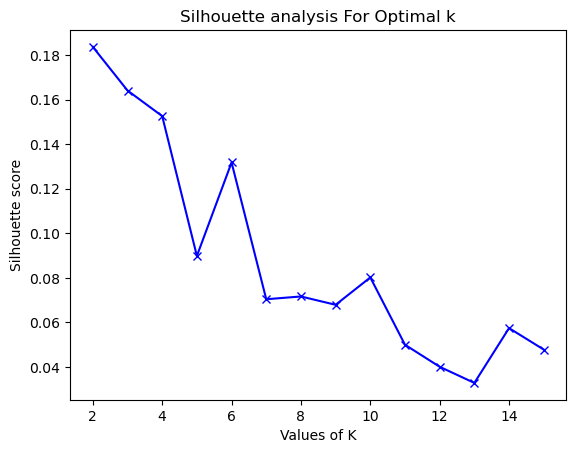

<Figure size 640x480 with 0 Axes>

In [411]:
range_n_clusters = [2,3, 4, 5, 6, 7, 8,9,10,11,12,13,14,15]
silhouette_avg = []
for num_clusters in range_n_clusters:
    # initialise kmeans
    kmeans = KMeans(n_clusters=num_clusters, init='k-means++', n_init=10)
    kmeans.fit_predict(anol_nonnan)
    cluster_labels = kmeans.labels_
    # silhouette score
    silhouette_avg.append(sklearn.metrics.silhouette_score(anol_nonnan, cluster_labels))

fig, ax = plt.subplots()

plt.plot(range_n_clusters,silhouette_avg,'bx-')
plt.xlabel('Values of K') 
plt.ylabel('Silhouette score') 
plt.title('Silhouette analysis For Optimal k')
plt.show()
plt.tight_layout()
#plt.savefig('../figures/silhuette_analysis.jpeg',dpi=300)

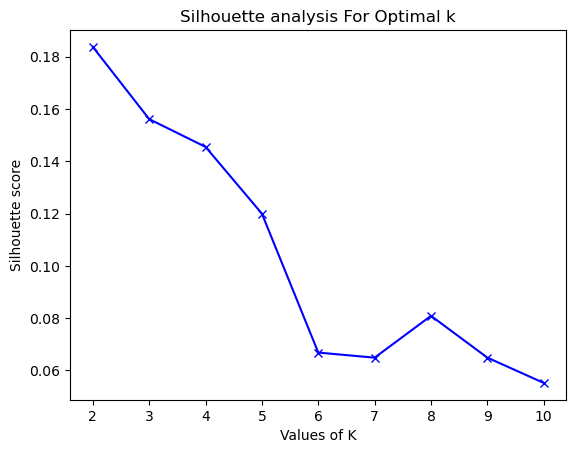

<Figure size 640x480 with 0 Axes>

In [418]:
range_n_clusters = [2,3, 4, 5, 6, 7, 8,9,10]
silhouette_avg = []
for num_clusters in range_n_clusters:
    # initialise kmeans
    kmeans = KMeans(n_clusters=num_clusters, init='k-means++', n_init=10)
    kmeans.fit_predict(anol_nonnan)
    cluster_labels = kmeans.labels_
    # silhouette score
    silhouette_avg.append(sklearn.metrics.silhouette_score(anol_nonnan, cluster_labels))

fig, ax = plt.subplots()

plt.plot(range_n_clusters,silhouette_avg,'bx-')
plt.xlabel('Values of K') 
plt.ylabel('Silhouette score') 
plt.title('Silhouette analysis For Optimal k')
plt.show()
plt.tight_layout()
#plt.savefig('../figures/silhuette_analysis.jpeg',dpi=300)

### 5) make your stacked xarray and convert to numpy

In [19]:
subset_cali_flat_np = subset_cali_flat.values.flatten()

### 6) remove nans from numpy

In [20]:
subset_cali_flat_np_nan = subset_cali_flat_np[~np.isnan(subset_cali_flat_np)]

### 7) reshape your numpy to 32x? 

In [24]:
print(subset_cali_flat.shape)
print(subset_cali_flat_np.shape)
print(subset_cali_flat_np_nan.shape)

(32, 6441)
(206112,)
(157792,)


In [26]:
subset_cali_flat_np_nan.shape[0]/32

4931.0

In [27]:
subset_cali_flat_np_nan_reshaped = subset_cali_flat_np_nan.reshape(32,4931)

### 8) run svd and clustering on this reshaped numpy

In [28]:
U_nan, S_nan, V_nan = svd(subset_cali_flat_np_nan_reshaped.T,full_matrices=False)

### 9) make the Data Array using the numpy coordinates and the svd and clustering outputs

In [31]:
subset_cali.shape

(32, 57, 113)

In [34]:
subset_cali_masked

<xarray.DataArray 'SWE_Post' (Year: 32, y: 57, x: 113)>
dask.array<where, shape=(32, 57, 113), dtype=float32, chunksize=(1, 57, 113), chunktype=numpy.ndarray>
Coordinates:
  * y            (y) float64 36.0 36.03 36.07 36.1 ... 37.88 37.92 37.95 37.99
  * x            (x) float64 -123.0 -123.0 -122.9 ... -119.1 -119.0 -119.0
  * Year         (Year) int64 1990 1991 1992 1993 1994 ... 2018 2019 2020 2021
    spatial_ref  int64 0

type: Rectangle.set() got an unexpected keyword argument 'robust'

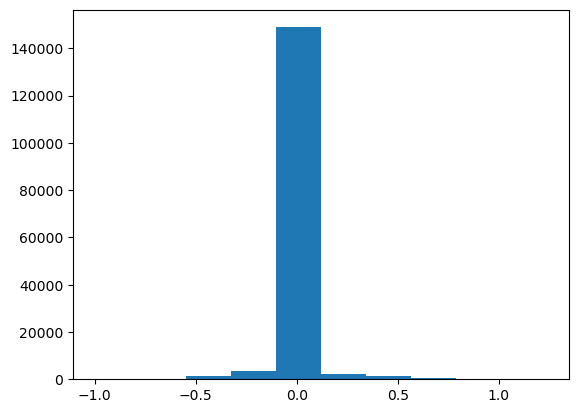

In [35]:
subset_cali_masked.plot(robust=True)

In [33]:
U_t = U_nan.T
U_t_reshaped = U_t.reshape(
        subset_cali.shape[0], subset_cali.shape[2], subset_cali.shape[1]
    )

# Use the negative of the EOFs to make them more interpretable:
U_dataArray = xr.DataArray(data = -U_t_reshaped,
                           dims=("EOF","x","y"),
                           coords=[np.linspace(1, 32, num=32, dtype=int),subset_cali.x,subset_cali.y])

type: cannot reshape array of size 157792 into shape (32,113,57)

In [121]:
flattened_anomalies = anomalies.stack(z=('x','y'))

In [122]:
flattened_anomalies.shape

(32, 20958750)

In [133]:
flattened_anomolies_np_flat = flattened_anomalies.values.flatten()

In [134]:
flattened_anomolies_np_flat.shape

(670680000,)

In [129]:
flattened_anomolies_np.shape

(32, 20958750)

In [135]:
flattened_anomalies_nan = flattened_anomolies_np_flat[~np.isnan(flattened_anomolies_np_flat)]

In [136]:
flattened_anomalies_nan.shape

(583191136,)

In [137]:
583191136/32

18224723.0

In [138]:
flattened_anomalies_nan.reshape(32,18224723)

array([[ 0.        ,  0.        ,  0.        , ..., -0.02215625,
        -0.018325  , -0.01574375],
       [ 0.        ,  0.        ,  0.        , ..., -0.02155625,
        -0.018125  , -0.01554375],
       [ 0.        ,  0.        ,  0.        , ..., -0.02215625,
        -0.018325  , -0.01574375],
       ...,
       [ 0.        ,  0.        ,  0.        , ..., -0.02195625,
        -0.017925  , -0.01514375],
       [ 0.        ,  0.        ,  0.        , ..., -0.00335625,
         0.002475  ,  0.00285625],
       [ 0.        ,  0.        ,  0.        , ..., -0.02215625,
        -0.018125  , -0.01574375]], dtype=float32)

In [127]:
type(anomalies)

xarray.core.dataarray.DataArray

In [125]:
type(flattened_anomalies_nan)

xarray.core.dataarray.DataArray

# Run the SVD analysis  
calculating EOFs (U matrix) and PCs (V matrix):

In [81]:
anomalies_fillna_flat = anomalies_fillna_coarser.stack(z=('x','y'))

In [82]:
# Perform the SVD

# perform svd analysis on swe reanalysis data
U, S, V = svd(anomalies_fillna_flat.T,full_matrices=False)

### Calculate and graph the variance explained by each EOF:

In [16]:
# SVD Variance Explained, divide S values by the sum of all S
var_exp = S / np.sum(S)

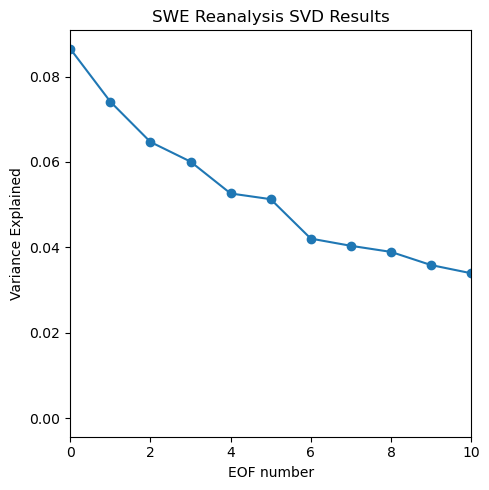

In [17]:
plt.figure(figsize=(5,5))
plt.plot(var_exp,'-o')
plt.xlabel('EOF number')
plt.ylabel('Variance Explained')
#plt.title('SVD Variance Explained')
#plt.ylim([0,0.16])
plt.xlim([0,10])
plt.title('SWE Reanalysis SVD Results')
plt.tight_layout()
#plt.savefig('../figures/91823/reanalysis_eof_varianceexplained.jpeg');

In [18]:
# the first 10:
#print(var_exp[0:10])

# sum of the first 10
print('Percent of overall variance explained by \nthe top 10 patterns = {}%'.format( np.round( 100*np.sum(var_exp[0:10]),1)), '\nthe top 4 patterns = {}%'.format( np.round( 100*np.sum(var_exp[0:4]),1)), '\nthe top 5 patterns = {}%'.format( np.round( 100*np.sum(var_exp[0:5]),1)), '\nthe top 7 patterns = {}%'.format( np.round( 100*np.sum(var_exp[0:7]),1)))

Percent of overall variance explained by 
the top 10 patterns = 54.7% 
the top 4 patterns = 28.5% 
the top 5 patterns = 33.8% 
the top 7 patterns = 43.1%


### Plot the first 4 PCs:

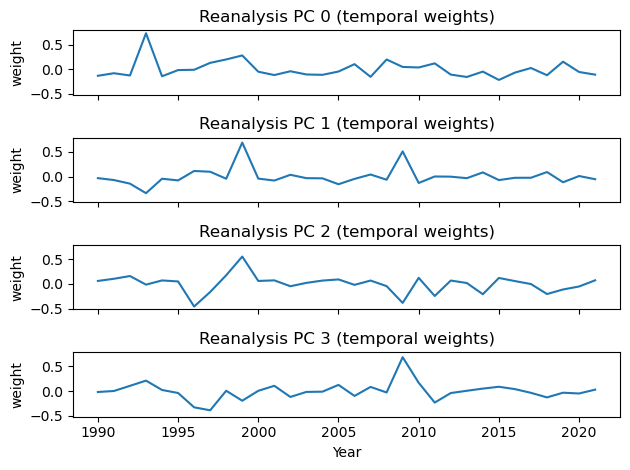

In [22]:
#Plot first PC (V)
f, ax = plt.subplots(4,1, sharex=True, sharey=True)
i=0
for row in range(4): 
    ax[row].plot(np.linspace(1990, 2021, num=32, dtype=int),V[i,:])
    ax[row].set_ylabel('weight')
    ax[row].set_title(f'Reanalysis PC {i} (temporal weights)')
    i+=1
ax[3].set_xlabel('Year')
plt.tight_layout()
#plt.savefig('../figures/91823/reanalysis_pc_plots.jpeg')

### Reshape the EOFs and add coordinates to an EOF DataArray:

In [23]:
anomalies_sdev_coarser.shape

(32, 506, 646)

In [85]:
U_t = U.T
V_t = V.T
print(U_t.shape)
print(V_t.shape)

(32, 326876)
(32, 32)


In [150]:
anomalies.x.shape

(5175,)

In [151]:
anomalies.shape

(32, 4050, 5175)

In [86]:
U_t_reshaped = U_t.reshape(
        anomalies.shape[0], anomalies.shape[2], anomalies.shape[1]
    )

# Use the negative of the EOFs to make them more interpretable:
U_dataArray = xr.DataArray(data = -U_t_reshaped,
                           dims=("EOF","x","y"),
                           coords=[np.linspace(1, 32, num=32, dtype=int),anomalies.x,anomalies.y])

type: cannot reshape array of size 10460032 into shape (32,5175,4050)

In [66]:
# Define the CRS:

U_dataArray = U_dataArray.rio.write_crs('epsg:4326')

In [69]:
U_dataArray_coarser = U_dataArray.coarsen(x=8, boundary='trim').mean().coarsen(y=8, boundary='trim').mean()

### Plot the first four EOFs:

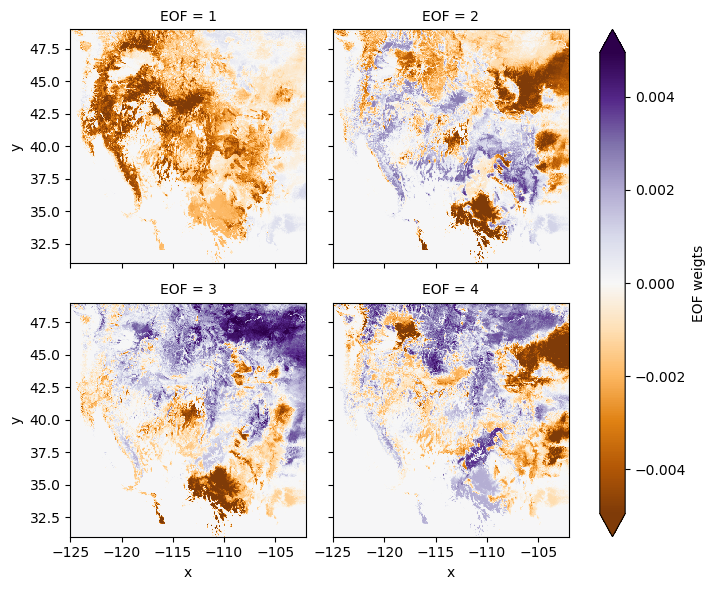

In [22]:
firstFour = U_dataArray.isel(EOF=slice(0, 4)).copy()

g = firstFour.plot.pcolormesh(
    x="x",
    y="y",
    col="EOF",
    col_wrap=2,
    robust=True,
    cmap="PuOr",
    cbar_kwargs={"label": "EOF weigts"},
)
#plt.savefig('../figures/91823/reanalysis_eof_plots.jpeg')

# K-means Clustering

#### The following cell takes a long time to run

/Users/Hannah/micromamba/envs/analysis_2023/lib/python3.9/site-packages/dask/array/numpy_compat.py:43: RuntimeWarning: invalid value encountered in divide
  x = np.divide(x1, x2, out)
/Users/Hannah/micromamba/envs/analysis_2023/lib/python3.9/site-packages/dask/array/numpy_compat.py:43: RuntimeWarning: invalid value encountered in divide
  x = np.divide(x1, x2, out)
/Users/Hannah/micromamba/envs/analysis_2023/lib/python3.9/site-packages/dask/array/numpy_compat.py:43: RuntimeWarning: invalid value encountered in divide
  x = np.divide(x1, x2, out)
/Users/Hannah/micromamba/envs/analysis_2023/lib/python3.9/site-packages/dask/array/numpy_compat.py:43: RuntimeWarning: invalid value encountered in divide
  x = np.divide(x1, x2, out)
/Users/Hannah/micromamba/envs/analysis_2023/lib/python3.9/site-packages/dask/array/numpy_compat.py:43: RuntimeWarning: invalid value encountered in divide
  x = np.divide(x1, x2, out)
/Users/Hannah/micromamba/envs/analysis_2023/lib/python3.9/site-packages/dask/arr

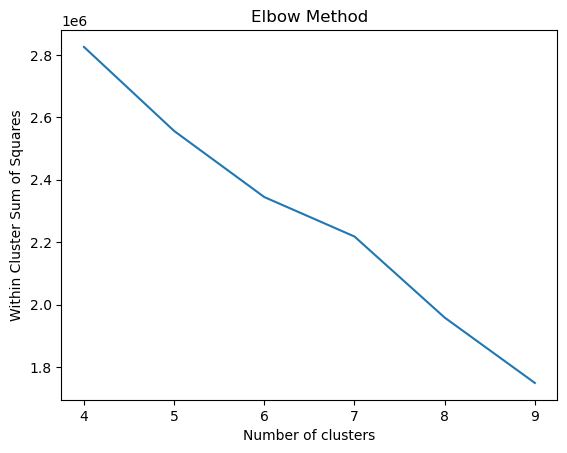

In [31]:
# # code from https://www.kaggle.com/code/ignacioalorre/clustering-features-based-on-correlation-and-tags
# # Determine optimun number of clusters for kmeans
# wcss = []
# max_num_clusters = 10
# for i in range(4, max_num_clusters):
#     kmeans = KMeans(n_clusters=i, init='k-means++', max_iter=300, n_init='auto', random_state=0)
#     kmeans.fit(flat_anom)
#     wcss.append(kmeans.inertia_)
# fig, ax = plt.subplots()    
# plt.plot(range(4, max_num_clusters), wcss)
# plt.title('Elbow Method')
# plt.xlabel('Number of clusters')
# plt.ylabel('Within Cluster Sum of Squares')
# plt.show()

### Next Steps:  
* Organize code
* Write a function for kmeans clustering for better organization (with +1 num clusters)
* Test Ross's spatial weighting on coarsened colorado
* Compare results from spatial weighting, eof clustering, and anomoly clustering

Later:  
* Create polygons
* Define clusters based on dominant weather/climate patterns
* Think about spatial autocorrelation: calculate Moran's I - strong possitive correlation indicates "it is likely the clusters we find will have a non-random spatial distribution." - https://geographicdata.science/book/notebooks/10_clustering_and_regionalization.html
* Figure out how to categorically color xarray plots, and keep colors the same for clusters

## Test methods on coarsened subset: Colorado

In [83]:
colorado = wstates[wstates['NAME'] == 'Colorado'].to_crs('epsg:4326')
colorado.bounds

,minx,miny,maxx,maxy
2,-109.060253,36.992426,-102.041524,41.003444


### Define boundaries for clipping to mountainous regions of CO:

In [84]:
min_lon = -109.060253
min_lat = 36.992426
max_lon = -104
max_lat = 41.003444

### Crop the EOF data array and anomalies/stdev to Colorado:

In [90]:
U_t_reshaped = U_t.reshape(
        anomalies_fillna_coarser.shape[0], anomalies_fillna_coarser.shape[2], anomalies_fillna_coarser.shape[1]
    )

# Use the negative of the EOFs to make them more interpretable:
U_dataArray_coarser = xr.DataArray(data = -U_t_reshaped,
                           dims=("EOF","x","y"),
                           coords=[np.linspace(1, 32, num=32, dtype=int),anomalies_fillna_coarser.x,anomalies_fillna_coarser.y])
U_dataArray_coarser = U_dataArray_coarser.rio.set_crs('epsg:4326')

In [91]:
subset_U = U_dataArray_coarser.rio.clip_box(minx=min_lon, miny=min_lat, maxx=max_lon, maxy=max_lat)

#subset_coarser = anomalies_sdev_coarser.rio.clip_box(minx=min_lon, miny=min_lat, maxx=max_lon, maxy=max_lat)

### Plot the Colorado anomolies/stdev:

/Users/Hannah/micromamba/envs/analysis_2023/lib/python3.9/site-packages/dask/array/numpy_compat.py:43: RuntimeWarning: invalid value encountered in divide
  x = np.divide(x1, x2, out)


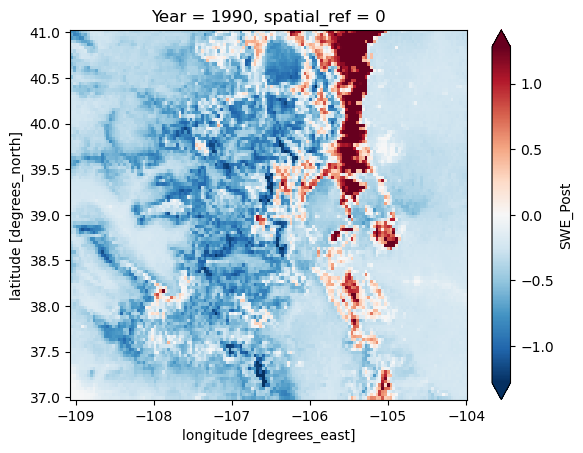

In [43]:
subset_coarser[0].plot(robust=True)

### Plot the first few Colorado EOFs:

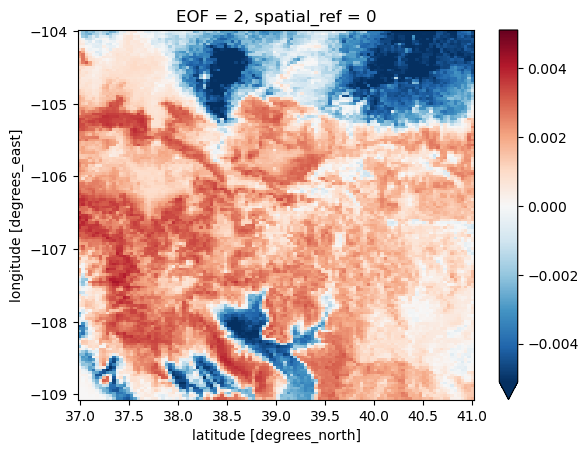

In [54]:
subset_U[1].plot(robust=True)

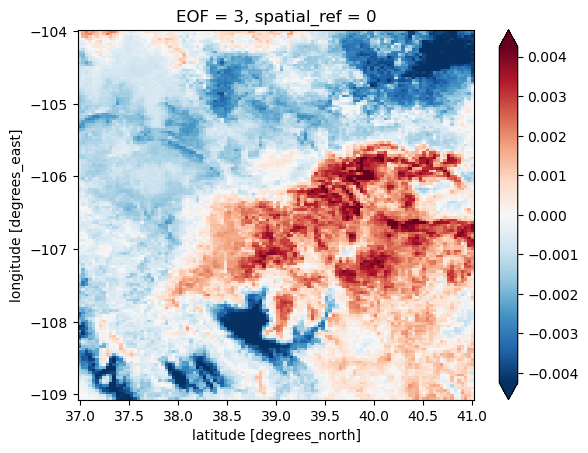

In [55]:
subset_U[2].plot(robust=True)

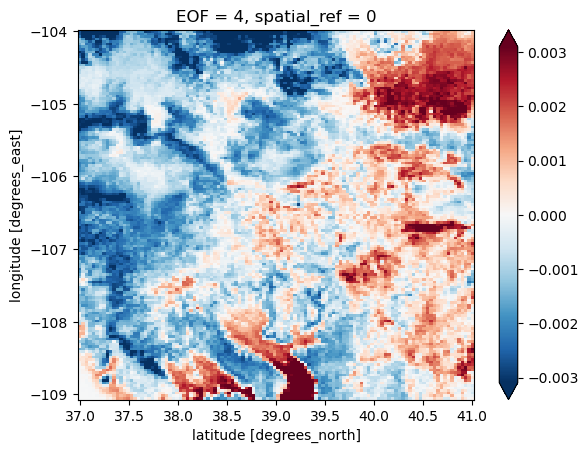

In [56]:
subset_U[3].plot(robust=True)

### Write a function for calculating K-mean Clusters:

In [96]:
def cluster(cluster_data, n_clusters_kmeans=6):
    # flatten the x and y components
    flattened = cluster_data.stack(z=('x','y'))
    # Add 1 to clusters to account for cluster that contains only 0s:
    n_clusters_kmeans = n_clusters_kmeans + 1
    # Define the kmeans clustering function:
    kmeans = KMeans(n_clusters = n_clusters_kmeans, init = 'k-means++', max_iter = 300, n_init = 10, random_state = 0)
    # Fit the clustering function to the flattened dataset:
    clusters = kmeans.fit_predict(flattened.T)

    return clusters

In [97]:
def reshape(cluster_data, clusters, n_clusters_kmeans=6, reshape_dimensions=[1,2]):
        # Rechape clustered data to match the input cluster_data again:
    clusters_reshaped = clusters.reshape(
        cluster_data.shape[reshape_dimensions[0]], cluster_data.shape[reshape_dimensions[1]]
        )
    # Add the spatial data from the input cluster_data for plotting:    
    clusters_dataArray = xr.DataArray(data=clusters_reshaped,
                                     dims=('x','y'),
                                     coords=[cluster_data.x,cluster_data.y])    
    # Define the CRS:
    clusters_dataArray = clusters_dataArray.rio.write_crs('epsg:4326')

    n_clusters_kmeans = n_clusters_kmeans + 1
    
    vals = np.arange(int(n_clusters_kmeans))/float(n_clusters_kmeans-1)
    cols = plt.cm.tab20b(vals)
    cmap = matplotlib.colors.ListedColormap(cols, int(n_clusters_kmeans)+1)
    norm=matplotlib.colors.Normalize(vmin=-0.5, vmax=n_clusters_kmeans+0.5)

    # Plot the resulting clusters:
    fig, ax = plt.subplots()
    im = clusters_dataArray.T.plot(ax=ax,robust=True, cmap=cmap)
    #cb = fig.colorbar(im, ax=ax,  norm=norm)
    #cb.set_ticks(np.linspace(0,n_clusters_kmeans, num = n_clusters_kmeans - 1))
    #wstates_4326.plot(ax=ax, facecolor='none', edgecolor='k')
    
    return clusters_dataArray

In [31]:
subset_U_clusters = cluster(subset_U, n_clusters_kmeans=5)

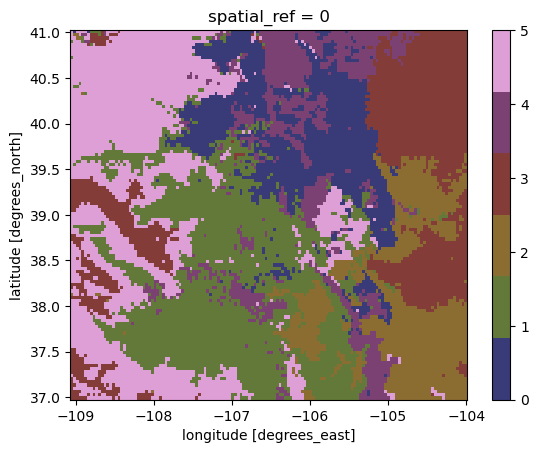

In [107]:
subset_U_da = reshape(subset_U, subset_U_clusters, 5, [1,2])

In [108]:
subset_anom_clusters = cluster(subset_coarser, n_clusters_kmeans=5)

/Users/Hannah/micromamba/envs/analysis_2023/lib/python3.9/site-packages/dask/array/numpy_compat.py:43: RuntimeWarning: invalid value encountered in divide
  x = np.divide(x1, x2, out)
/Users/Hannah/micromamba/envs/analysis_2023/lib/python3.9/site-packages/dask/array/numpy_compat.py:43: RuntimeWarning: invalid value encountered in divide
  x = np.divide(x1, x2, out)


In [ ]:
subset_anom_da = reshape(anomalies_sdev_coarser, subset_anom_clusters, 5, [2,1])

### Spatial Weighting:

In [94]:
subset_coarser = anomalies_fillna_coarser.rio.clip_box(minx=min_lon, miny=min_lat, maxx=max_lon, maxy=max_lat)

In [100]:
subset_coarser

<xarray.DataArray 'SWE_Post' (Year: 32, y: 114, x: 143)>
dask.array<getitem, shape=(32, 114, 143), dtype=float32, chunksize=(1, 114, 143), chunktype=numpy.ndarray>
Coordinates:
  * y            (y) float64 36.99 37.03 37.06 37.1 ... 40.9 40.94 40.97 41.01
  * x            (x) float64 -109.1 -109.0 -109.0 ... -104.1 -104.0 -104.0
  * Year         (Year) int64 1990 1991 1992 1993 1994 ... 2018 2019 2020 2021
    spatial_ref  int64 0

In [116]:
from libpysal.weights import Queen

w = Queen.from_xarray(subset_coarser, coords_labels={'y_label': 'y', 'x_label': 'x', 'z_label': 'Year'})

/Users/Hannah/micromamba/envs/analysis_2023/lib/python3.9/site-packages/libpysal/weights/raster.py:505: UserWarning: Multiple layers detected. Using first layer as default.
  warn("Multiple layers detected. Using first layer as default.")


In [145]:
w

In [119]:
w?

Type:        WSP
String form: <libpysal.weights.weights.WSP object at 0x15fbe2c70>
File:        ~/micromamba/envs/analysis_2023/lib/python3.9/site-packages/libpysal/weights/weights.py
Docstring:  
Thin ``W`` class for ``spreg``.

Parameters
----------

sparse : scipy.sparse.{matrix-type}
    NxN object from ``scipy.sparse``

Attributes
----------

n           : int
              description
s0          : float
              description
trcWtW_WW   : float
              description

Examples
--------

From GAL information

>>> import scipy.sparse
>>> from libpysal.weights import WSP
>>> rows = [0, 1, 1, 2, 2, 3]
>>> cols = [1, 0, 2, 1, 3, 3]
>>> weights =  [1, 0.75, 0.25, 0.9, 0.1, 1]
>>> sparse = scipy.sparse.csr_matrix((weights, (rows, cols)), shape=(4,4))
>>> w = WSP(sparse)
>>> w.s0
4.0
>>> w.trcWtW_WW
6.395
>>> w.n
4

In [147]:
w.weights

type: 'WSP' object has no attribute 'weights'

In [127]:
w_w = w.to_W

In [130]:
w_w?

Signature: w_w(silence_warnings=False)
Docstring:
Convert a pysal WSP object (thin weights matrix) to a pysal W object.

Parameters
----------
self : WSP
    PySAL sparse weights object.
silence_warnings : bool
    Switch to ``True`` to turn off print statements for every
    observation with islands. Default is ``False``, which does
    not silence warnings.

Returns
-------
w : W
    PySAL weights object.

Examples
--------
>>> from libpysal.weights import lat2SW, WSP, WSP2W

Build a 10x10 ``scipy.sparse`` matrix for a rectangular 2x5
region of cells (rook contiguity), then construct a ``libpysal``
sparse weights object (``self``).

>>> sp = lat2SW(2, 5)
>>> self = WSP(sp)
>>> self.n
10
>>> print(self.sparse[0].todense())
[[0 1 0 0 0 1 0 0 0 0]]

Convert this sparse weights object to a standard PySAL weights object.

>>> w = WSP2W(self)
>>> w.n
10
>>> print(w.full()[0][0])
[0. 1. 0. 0. 0. 1. 0. 0. 0. 0.]
File:      ~/micromamba/envs/analysis_2023/lib/python3.9/site-packages/libpysal/

In [132]:
w_w.plot()

type: 'function' object has no attribute 'plot'

In [114]:
w.s2array

type: 'WSP' object has no attribute 's2array'

In [136]:
KMeans?

Init signature:
KMeans(
    n_clusters=8,
    *,
    init='k-means++',
    n_init='warn',
    max_iter=300,
    tol=0.0001,
    verbose=0,
    random_state=None,
    copy_x=True,
    algorithm='lloyd',
)
Docstring:     
K-Means clustering.

Read more in the :ref:`User Guide <k_means>`.

Parameters
----------

n_clusters : int, default=8
    The number of clusters to form as well as the number of
    centroids to generate.

init : {'k-means++', 'random'}, callable or array-like of shape             (n_clusters, n_features), default='k-means++'
    Method for initialization:

    'k-means++' : selects initial cluster centroids using sampling based on
    an empirical probability distribution of the points' contribution to the
    overall inertia. This technique speeds up convergence. The algorithm
    implemented is "greedy k-means++". It differs from the vanilla k-means++
    by making several trials at each sampling step and choosing the best centroid
    among them.

    'random': cho

In [112]:
flattened = subset_coarser.stack(z=('x','y'))
n_clusters_kmeans = 6
kmeans = KMeans(n_clusters = n_clusters_kmeans, init = 'k-means++', max_iter = 300, n_init = 10, random_state = 0)
clusters = kmeans.fit_predict(flattened.T, sample_weight=w)

type: 'WSP' object has no attribute 'ndim'

In [98]:
subset_clusters = cluster(subset_coarser, n_clusters_kmeans=6)

In [ ]:
# flatten the x and y components
flattened = cluster_data.stack(z=('x','y'))
# Add 1 to clusters to account for cluster that contains only 0s:
n_clusters_kmeans = n_clusters_kmeans + 1
# Define the kmeans clustering function:
kmeans = KMeans(n_clusters = n_clusters_kmeans, init = 'k-means++', max_iter = 300, n_init = 10, random_state = 0)
# Fit the clustering function to the flattened dataset:
clusters = kmeans.fit_predict(flattened.T)


In [96]:
subset_clusters_reshape_w = clusters_reshaped = clusters.reshape(
        cluster_data.shape[reshape_dimensions[0]], cluster_data.shape[reshape_dimensions[1]]
        )
    # Add the spatial data from the input cluster_data for plotting:    
    clusters_dataArray = xr.DataArray(data=clusters_reshaped,
                                     dims=('x','y'),
                                     coords=[cluster_data.x,cluster_data.y])    
    # Define the CRS:
    clusters_dataArray = clusters_dataArray.rio.write_crs('epsg:4326')

<xarray.DataArray (EOF: 32, x: 143, y: 114)>
array([[[-2.1481204e-05, -2.1481204e-05, -2.1481204e-05, ...,
         -2.5838194e-03, -2.7501716e-03, -2.3696085e-03],
        [-2.1481204e-05, -2.1481204e-05, -6.4443637e-05, ...,
         -2.5093851e-03, -2.1029643e-03, -2.1283401e-03],
        [-2.1481204e-05, -6.4443637e-05, -1.0655467e-05, ...,
         -2.1021070e-03, -2.5122361e-03, -2.5913736e-03],
        ...,
        [ 2.9020061e-04,  5.1635783e-05, -7.9689044e-06, ...,
         -1.6995659e-03, -1.7175495e-03, -1.4624652e-03],
        [ 2.5173771e-04,  1.8503948e-05,  1.3905744e-05, ...,
         -1.7341671e-03, -1.2513720e-03, -1.2307293e-03],
        [ 2.3494600e-04,  2.6368743e-05, -5.8143876e-05, ...,
         -1.2857434e-03, -1.3611723e-03, -1.4455724e-03]],

       [[ 5.5693977e-06,  5.5693977e-06,  5.5693977e-06, ...,
          1.1458887e-03,  1.4457275e-03,  1.6633512e-03],
        [ 5.5693977e-06,  5.5693977e-06,  1.6708194e-05, ...,
          1.1084519e-03,  1.3247028e-03,  1.3967351e-03],
        [ 5.5693977e-06,  1.6708194e-05,  1.6187405e-05, ...,
          1.2533724e-03,  1.3138988e-03,  1.3406408e-03],
...
        [-9.4825844e-04, -2.2036179e-03, -2.1422156e-03, ...,
         -4.7363136e-03, -5.7718819e-03, -6.1794147e-03],
        [-1.4300835e-03, -1.7417677e-03, -1.8317029e-03, ...,
         -6.5108533e-03, -9.3644299e-03, -5.9494143e-03],
        [-1.8386024e-03, -1.8291313e-03, -1.5291200e-03, ...,
         -2.8878683e-03, -6.6120834e-03, -4.7276625e-03]],

       [[ 3.0123500e-05,  3.0123500e-05,  3.0123500e-05, ...,
          1.5711606e-03, -5.7557911e-05,  1.2876671e-05],
        [ 3.0123500e-05,  3.0123500e-05, -1.5392592e-05, ...,
          1.2167628e-03, -5.1291939e-03,  1.8623348e-04],
        [ 3.0123500e-05, -1.5392592e-05, -1.8749848e-06, ...,
         -1.4793823e-04, -1.8405783e-03, -2.0985557e-03],
        ...,
        [-7.6370529e-04,  2.7911006e-03,  9.8944048e-04, ...,
          7.3607202e-04, -2.2518877e-03,  1.2862835e-04],
        [-4.3841262e-04,  3.7565079e-04,  5.0610967e-04, ...,
          6.7684689e-04, -2.8376002e-03, -1.4933207e-03],
        [ 1.8455882e-03,  1.9162756e-03, -2.3602281e-04, ...,
          1.2964458e-05,  2.1005646e-04, -7.9647353e-04]]], dtype=float32)
Coordinates:
  * EOF          (EOF) int64 1 2 3 4 5 6 7 8 9 10 ... 24 25 26 27 28 29 30 31 32
  * x            (x) float64 -109.1 -109.0 -109.0 ... -104.1 -104.0 -104.0
  * y            (y) float64 36.99 37.03 37.06 37.1 ... 40.9 40.94 40.97 41.01
    spatial_ref  int64 0

In [100]:
type(w)

libpysal.weights.weights.WSP

### Test NAN removal:

In [109]:
import numpy as np
import copy

In [111]:
anomalies = ds.SWE_Post - ds.SWE_Post.mean(dim='Year')

In [112]:
subset_coarser = anomalies_sdev_coarser.rio.clip_box(minx=min_lon, miny=min_lat, maxx=max_lon, maxy=max_lat)

In [113]:
subset_coarser_nan = subset_coarser.where(subset_coarser != np.nan)

In [114]:
flat_anom = subset_coarser.stack(z=('x','y'))

In [116]:
flat_anom.shape

(32, 16302)

In [119]:
flat_anom_nan = flat_anom.where(flat_anom.isnull())

In [120]:
flat_anom_nan.shape

(32, 16302)

In [115]:
flat_anom

<xarray.DataArray 'SWE_Post' (Year: 32, z: 16302)>
dask.array<reshape, shape=(32, 16302), dtype=float32, chunksize=(1, 16302), chunktype=numpy.ndarray>
Coordinates:
  * Year         (Year) int64 1990 1991 1992 1993 1994 ... 2018 2019 2020 2021
    spatial_ref  int64 0
  * z            (z) object MultiIndex
  * x            (z) float64 -109.1 -109.1 -109.1 ... -104.0 -104.0 -104.0
  * y            (z) float64 36.99 37.03 37.06 37.1 ... 40.9 40.94 40.97 41.01

In [35]:
# From Michelle Hu, possible solution to nans in my raster:

import numpy as np
import copy

# this is a func that is meant to stand in place for your transform
# def cassie_transform(inputarray, multiplyby=10):
#     return inputarray * multiplyby

# orig_arr = np.array([[0, 1, np.nan],
#                      [1, np.nan, 3],
#                      [2, np.nan, np.nan]])
# print(orig_arr)
print(flat_anom_stdev)

# keep only the not nan values from original array to work on
raveled_arr = array_anom_stdev[~np.isnan(array_anom_stdev)]
print(raveled_arr.shape)

# do what you gotta do, assuming it yields the same shape of vals
Uma, Sma, Vma = svd(raveled_arr.T,full_matrices=False)
print(Uma.shape)

# copy your original array format
Uma_new = copy.deepcopy(Uma)
Vma_new = copy.deepcopy(Vma)

# pop the transformed values back into the correct spots
Uma_new[~np.isnan(Uma_new)] = Uma
print(Uma_new)

<xarray.DataArray 'SWE_Post' (Year: 32, z: 326876)>
dask.array<reshape, shape=(32, 326876), dtype=float32, chunksize=(1, 326876), chunktype=numpy.ndarray>
Coordinates:
    spatial_ref  int64 0
  * Year         (Year) int64 1990 1991 1992 1993 1994 ... 2018 2019 2020 2021
  * z            (z) object MultiIndex
  * x            (z) float64 -125.0 -125.0 -125.0 ... -102.0 -102.0 -102.0
  * y            (z) float64 31.02 31.05 31.09 31.12 ... 48.87 48.9 48.94 48.97
(7566816,)


type: expected matrix

### Scale up to the Western US:

In [ ]:
subset_anom_clusters = cluster(anomalies_sdev_coarser, n_clusters_kmeans=5)

/Users/Hannah/micromamba/envs/analysis_2023/lib/python3.9/site-packages/dask/array/numpy_compat.py:43: RuntimeWarning: invalid value encountered in divide
  x = np.divide(x1, x2, out)


In [89]:
n_clusters_kmeans = 6
kmeans = KMeans(n_clusters = n_clusters_kmeans, init = 'k-means++', max_iter = 300, n_init = 10, random_state = 0)
clusters = kmeans.fit_predict(subset_U_flattened.T)

In [102]:
U_dataArray_flattened = U_dataArray.stack(z=('x','y'))

In [103]:
n_clusters_kmeans = 7
kmeans = KMeans(n_clusters = n_clusters_kmeans, init = 'k-means++', max_iter = 300, n_init = 10, random_state = 0)
clusters_all = kmeans.fit_predict(U_dataArray_flattened.T)

In [104]:
clusters_all_reshaped = clusters_all.reshape(
    U_dataArray.shape[1], U_dataArray.shape[2]
)

clusters_all_dataArray = xr.DataArray(data=clusters_all_reshaped,
                                 dims=('x','y'),
                                 coords=[U_dataArray.x,U_dataArray.y])

<Axes: xlabel='x', ylabel='y'>

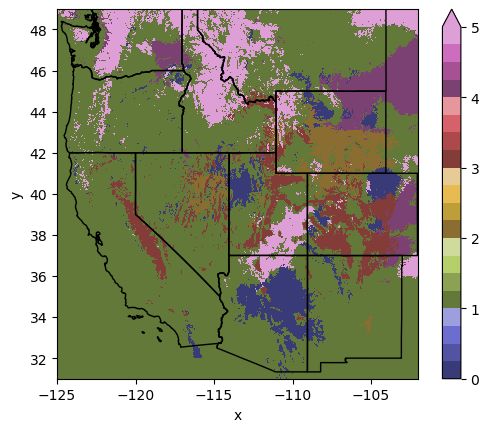

In [105]:
#clusters_all_dataArray.T.plot()
fig, ax = plt.subplots()
clusters_all_dataArray.T.plot(robust=True, ax=ax, cmap='tab20b')
wstates_4326.plot(ax=ax, facecolor='none', edgecolor='k')

In [166]:
flat_anom_nan = np.nan_to_num(flat_anom, copy=True, nan=0.0, posinf=0.0, neginf=0.0)

/Users/Hannah/micromamba/envs/analysis_2023/lib/python3.9/site-packages/dask/array/numpy_compat.py:43: RuntimeWarning: invalid value encountered in divide
  x = np.divide(x1, x2, out)


In [167]:
n_clusters_kmeans = 7
kmeans = KMeans(n_clusters = n_clusters_kmeans, init = 'k-means++', max_iter = 300, n_init = 10, random_state = 0)
clusters_orig = kmeans.fit_predict(flat_anom_nan.T)

In [170]:
clusters_orig_reshaped = clusters_orig.reshape(
    anomalies_sdev_coarser.shape[2], anomalies_sdev_coarser.shape[1]
)

clusters_orig_dataArray = xr.DataArray(data=clusters_orig_reshaped,
                                 dims=('x','y'),
                                 coords=[anomalies_sdev_coarser.x,anomalies_sdev_coarser.y])

<Axes: xlabel='x', ylabel='y'>

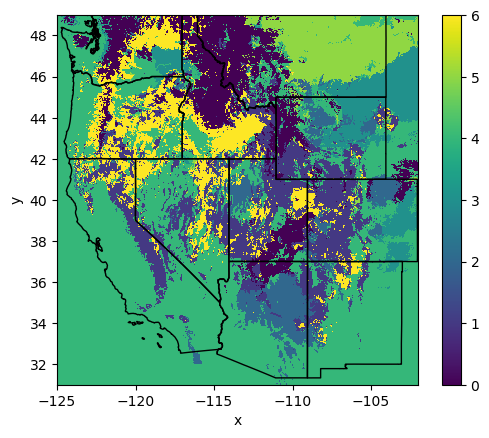

In [171]:
fig, ax = plt.subplots()
clusters_orig_dataArray.T.plot(robust=True, ax=ax)
wstates_4326.plot(ax=ax, facecolor='none', edgecolor='k')

<Axes: xlabel='x', ylabel='y'>

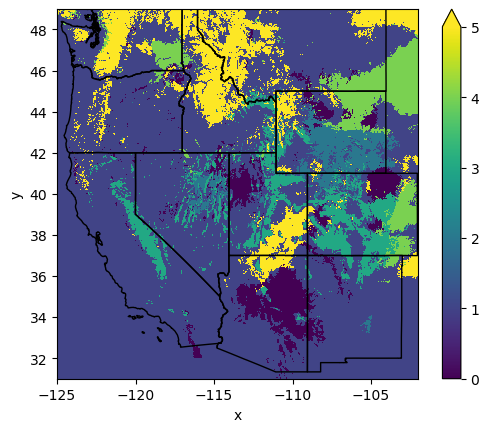

In [165]:
fig, ax = plt.subplots()
clusters_all_dataArray.T.plot(robust=True, ax=ax)
wstates_4326.plot(ax=ax, facecolor='none', edgecolor='k')

### Find optimal cluster number using coarsened dataset:

In [ ]:
anomalies_fillna_coarser15_lowsnow = anomalies_fillna_coarser15.where('Year'>0.05)

In [152]:
anomalies_fillna_coarser15_flattened = anomalies_fillna_coarser15.stack(z=('x','y'))

In [ ]:
range_n_clusters = [3, 4, 5, 6, 7, 8,9,10,11,12]
silhouette_avg = []
for num_clusters in range_n_clusters:
    # initialise kmeans
    kmeans = KMeans(n_clusters=num_clusters, init='k-means++', n_init=10)
    kmeans.fit_predict(anomalies_fillna_coarser15_flattened)
    cluster_labels = kmeans.labels_
    # silhouette score
    silhouette_avg.append(sklearn.metrics.silhouette_score(anomalies_fillna_coarser15_flattened, cluster_labels))
plt.plot(range_n_clusters,silhouette_avg,'bx-')
plt.xlabel('Values of K') 
plt.ylabel('Silhouette score') 
plt.title('Silhouette analysis For Optimal k')
plt.show()
plt.tight_layout()

<Axes: >

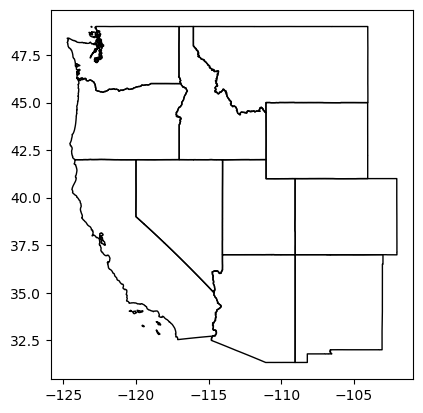

In [132]:
wstates_4326.plot(facecolor='none', edgecolor='k')

In [74]:
clusters.shape

(16302,)

In [95]:
subset_coarser = 

<xarray.DataArray 'SWE_Post' ()>
dask.array<any-aggregate, shape=(), dtype=bool, chunksize=(), chunktype=numpy.ndarray>
Coordinates:
    spatial_ref  int64 0

In [104]:
subset_coarser = subset_coarser.fillna(0.0)
from numpy import inf
subset_coarser.where(subset_coarser == -inf) = 0.0
subset_coarser.where(subset_coarser == inf) = 0.0

type: cannot assign to function call (2251747511.py, line 3)

In [101]:
subset_coarser_flattened = subset_coarser.stack(z=('x','y'))

In [93]:
type(subset_coarser_flattened)

xarray.core.dataarray.DataArray

In [102]:
clusters_raw = kmeans.fit_predict(subset_coarser_flattened.T)


KeyboardInterrupt: 

In [82]:
subset_coarser.shape

(32, 114, 143)

In [83]:
clusters_reshaped = clusters.reshape(
    subset_coarser.shape[2], subset_coarser.shape[1]
)

clusters_dataArray = xr.DataArray(data=clusters_reshaped,
                                 dims=('x','y'),
                                 coords=[subset_coarser.x,subset_coarser.y])

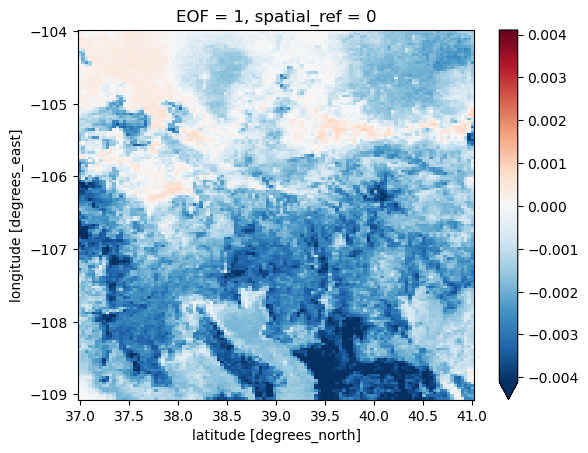

In [53]:
subset_U[0].plot(robust=True)

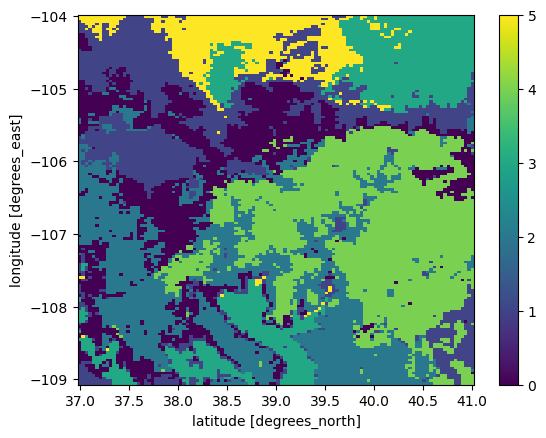

In [85]:
clusters_dataArray.plot(robust=True)

In [77]:
n_clusters_kmeans = 6
kmeans = KMeans(n_clusters = n_clusters_kmeans, init = 'k-means++')
clusters = kmeans.fit_predict(subset_U_flattened[0:5].T)

/Users/Hannah/micromamba/envs/analysis_2023/lib/python3.9/site-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(


In [76]:
anomalies_sdev_coarser.shape

(32, 506, 646)

In [ ]:
U_t_reshaped = U_t.reshape(
        anomalies_sdev_coarser.shape[0], anomalies_sdev_coarser.shape[2], anomalies_sdev_coarser.shape[1]
    )

U_dataArray = xr.DataArray(data = -U_t_reshaped,
                           dims=("EOF","x","y"),
                           coords=[np.linspace(1, 32, num=32, dtype=int),anomalies_sdev_coarser.x,anomalies_sdev_coarser.y])

In [68]:
subset_U_flattened[0:4]

<xarray.DataArray (EOF: 4, z: 16302)>
array([[-2.1481204e-05, -2.1481204e-05, -2.1481204e-05, ...,
        -1.2857434e-03, -1.3611723e-03, -1.4455724e-03],
       [ 5.5693977e-06,  5.5693977e-06,  5.5693977e-06, ...,
        -3.9041927e-03, -3.6387318e-03, -4.6936222e-03],
       [-2.5124222e-05, -2.5124222e-05, -2.5124222e-05, ...,
        -3.0443678e-03, -2.7401689e-03, -3.2047713e-03],
       [-1.1613855e-06, -1.1613855e-06, -1.1613855e-06, ...,
         4.1363703e-04,  3.3142835e-05,  8.7736663e-04]], dtype=float32)
Coordinates:
  * EOF          (EOF) int64 1 2 3 4
    spatial_ref  int64 0
  * z            (z) object MultiIndex
  * x            (z) float64 -109.1 -109.1 -109.1 ... -104.0 -104.0 -104.0
  * y            (z) float64 36.99 37.03 37.06 37.1 ... 40.9 40.94 40.97 41.01

In [79]:
clusters.shape

(16302,)

In [70]:
subset_U_flattened[0].reshape(-1,1)

type: 'DataArray' object has no attribute 'reshape'

In [ ]:
# Using kmeans to cluster the features based on their correlation
def cluster(n_clusters_kmeans, correlation_df):

    kmeans = KMeans(n_clusters = n_clusters_kmeans, init = 'k-means++', max_iter = 300, n_init = 10, random_state = 0)
    pearsons_cc_labels = kmeans.fit_predict(correlation_df)
    feat_names = combined_april1_anom.columns
    # Preparing a dataframe to collect some cluster stats
    pearsons_cc_clust_df = pd.DataFrame(np.c_[feat_names, pearsons_cc_labels])
    pearsons_cc_clust_df.columns = ['feature", "cluster"]
    pearsons_cc_clust_df['feat_list'] = pearsons_cc_clust_df.groupby(["cluster"]).transform(lambda x: ', '.join(x))
    pearsons_cc_clust_df = pearsons_cc_clust_df.groupby(["cluster", "feat_list"]).size().reset_index(name = 'feat_count')

    corr_node_dist = kmeans.transform(correlation_df)
    corr_clust_dist = np.c_[feat_names, np.round(corr_node_dist.min(axis=1),3), np.round(corr_node_dist.min(axis=1)/np.max(corr_node_dist.min(axis=1)),3), pearsons_cc_labels]
    corr_clust_dist_df = pd.DataFrame(corr_clust_dist)
    corr_clust_dist_df.columns = ['feature', 'dist_corr', 'dist_corr_norm', 'cluster_corr']

    cluster_array = corr_clust_dist_df['cluster_corr'].values
    station_locations['cluster_corr'] = cluster_array
    
    fig, ax = plt.subplots()

    station_locations.plot(ax=ax, column='cluster_corr')
    ctx.add_basemap(ax=ax, crs='epsg:4326', source='https://mt1.google.com/vt/lyrs=s&x={x}&y={y}&z={z}')
    wstates.to_crs('epsg:4326').plot(ax=ax, facecolor='none')
    ax.set_title('{} Clusters'.format(n_clusters_kmeans))
    ax.set_xlabel('Longitude')
    ax.set_ylabel('Latitude')

In [273]:
ds

<xarray.Dataset>
Dimensions:      (y: 4050, x: 5175, Year: 32)
Coordinates:
  * y            (y) float64 31.0 31.01 31.01 31.02 ... 48.98 48.99 48.99 49.0
  * x            (x) float64 -125.0 -125.0 -125.0 ... -102.0 -102.0 -102.0
    spatial_ref  int64 0
  * Year         (Year) int64 1990 1991 1992 1993 1994 ... 2018 2019 2020 2021
Data variables:
    SWE_Post     (Year, y, x) float32 dask.array<chunksize=(1, 4050, 5175), meta=np.ndarray>

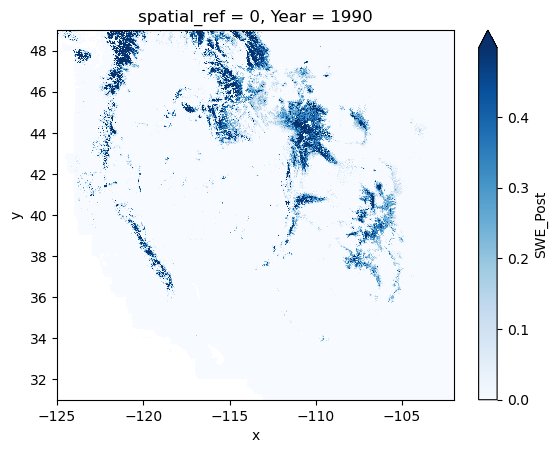

In [277]:
ds.SWE_Post[0].plot(robust=True, cmap='Blues')

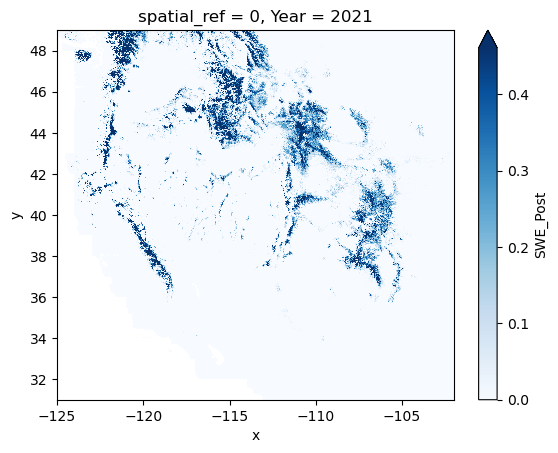

In [280]:
ds.SWE_Post[31].plot(robust=True, cmap='Blues')

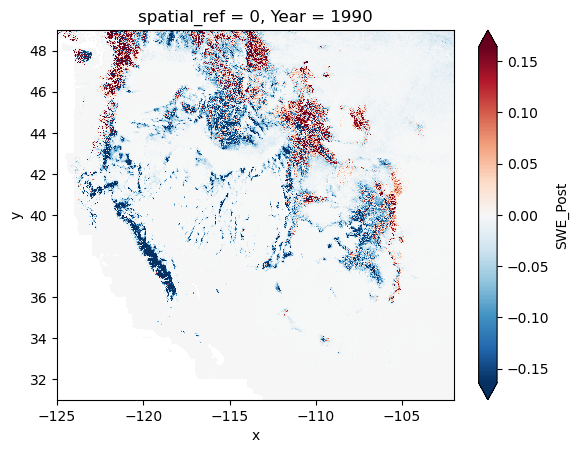

In [281]:
anomalies[0].plot(robust=True)

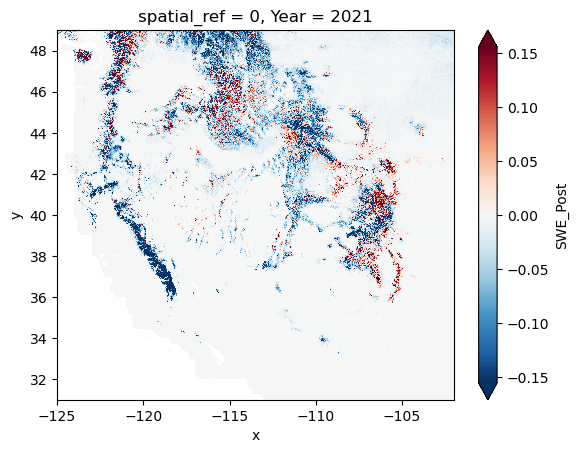

In [282]:
anomalies[31].plot(robust=True)

/Users/Hannah/micromamba/envs/analysis_2023/lib/python3.9/site-packages/dask/array/numpy_compat.py:43: RuntimeWarning: invalid value encountered in divide
  x = np.divide(x1, x2, out)
/Users/Hannah/micromamba/envs/analysis_2023/lib/python3.9/site-packages/dask/core.py:121: RuntimeWarning: invalid value encountered in divide
  return func(*(_execute_task(a, cache) for a in args))


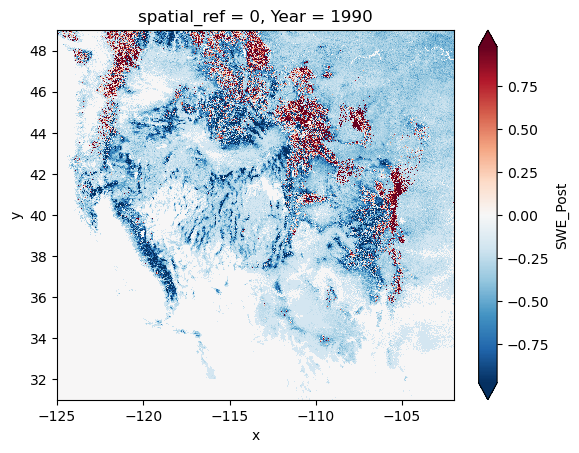

In [10]:
anomalies_sdev[0].plot(robust=True)

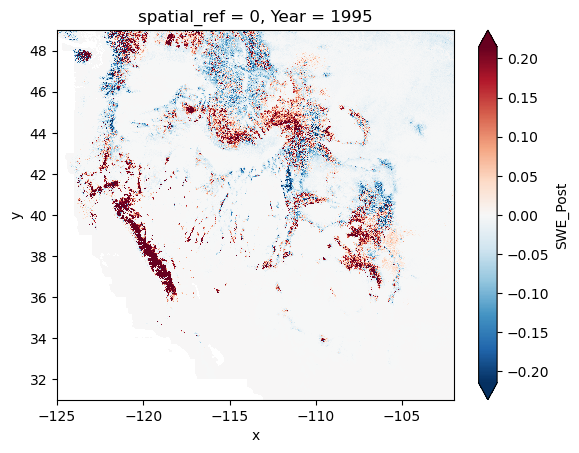

In [24]:
anomalies[5].plot(robust=True)

/Users/Hannah/micromamba/envs/analysis_2023/lib/python3.9/site-packages/dask/array/numpy_compat.py:43: RuntimeWarning: invalid value encountered in divide
  x = np.divide(x1, x2, out)
/Users/Hannah/micromamba/envs/analysis_2023/lib/python3.9/site-packages/dask/core.py:121: RuntimeWarning: invalid value encountered in divide
  return func(*(_execute_task(a, cache) for a in args))


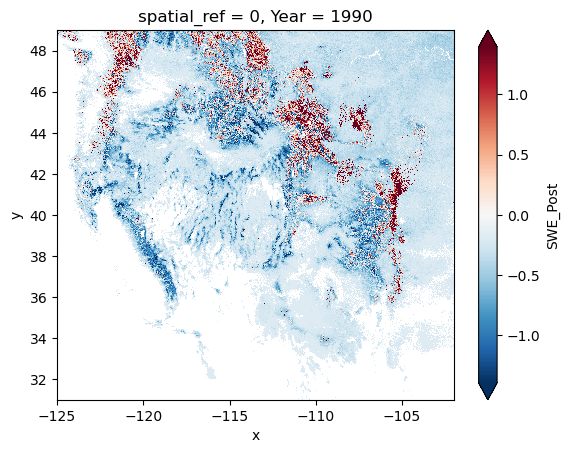

In [27]:
anomalies_sdev[0].plot(robust=True)

In [8]:
anomalies_sdev

<xarray.DataArray 'SWE_Post' (Year: 32, y: 4050, x: 5175)>
dask.array<truediv, shape=(32, 4050, 5175), dtype=float32, chunksize=(1, 4050, 5175), chunktype=numpy.ndarray>
Coordinates:
  * y            (y) float64 31.0 31.01 31.01 31.02 ... 48.98 48.99 48.99 49.0
  * x            (x) float64 -125.0 -125.0 -125.0 ... -102.0 -102.0 -102.0
    spatial_ref  int64 0
  * Year         (Year) int64 1990 1991 1992 1993 1994 ... 2018 2019 2020 2021

/Users/Hannah/micromamba/envs/analysis_2023/lib/python3.9/site-packages/dask/array/numpy_compat.py:43: RuntimeWarning: invalid value encountered in divide
  x = np.divide(x1, x2, out)


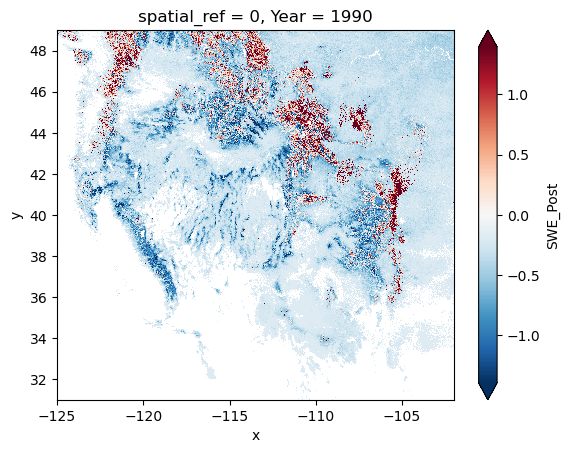

In [9]:
anomalies_sdev[0].plot(robust=True) 

In [10]:
anomalies_sdev.rio.crs

CRS.from_epsg(4326)

In [9]:
anomalies_sdev_coarse = anomalies_sdev.coarsen(x=4, boundary='trim').mean().coarsen(y=4, boundary='trim').mean()

In [6]:
anomalies_coarser = anomalies.coarsen(x=8, boundary='trim').mean().coarsen(y=8, boundary='trim').mean()

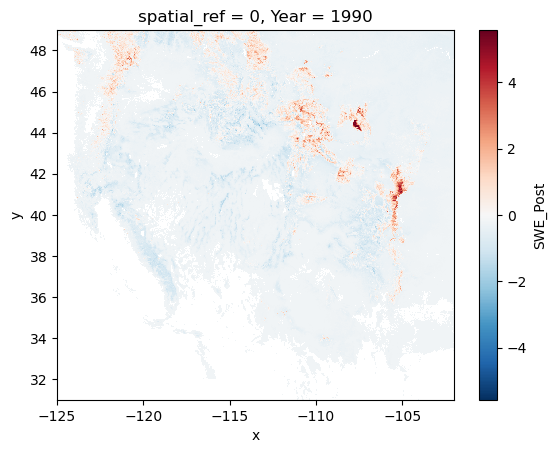

In [18]:
anomalies_sdev_coarse[0].plot()

/Users/Hannah/micromamba/envs/analysis_2023/lib/python3.9/site-packages/dask/array/numpy_compat.py:43: RuntimeWarning: invalid value encountered in divide
  x = np.divide(x1, x2, out)


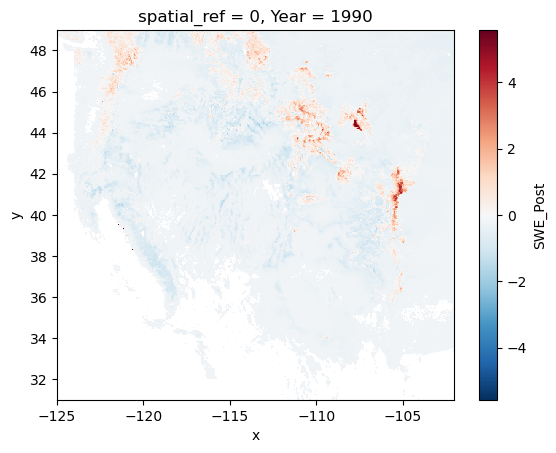

In [20]:
anomalies_sdev_coarser[0].plot()

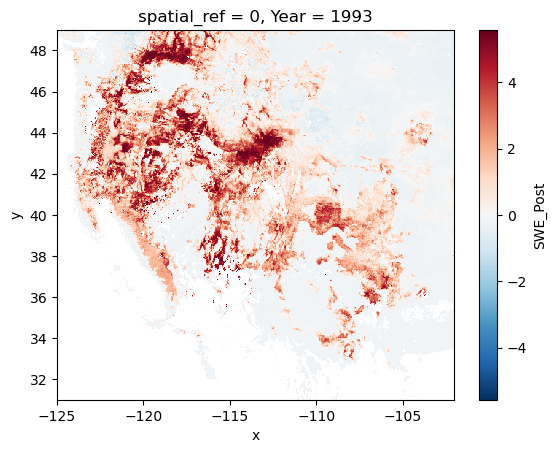

In [39]:
anomalies_sdev_coarser[3].plot()

In [22]:
anomalies_sdev

<xarray.DataArray 'SWE_Post' (Year: 32, y: 4050, x: 5175)>
dask.array<truediv, shape=(32, 4050, 5175), dtype=float32, chunksize=(1, 4050, 5175), chunktype=numpy.ndarray>
Coordinates:
  * y            (y) float64 31.0 31.01 31.01 31.02 ... 48.98 48.99 48.99 49.0
  * x            (x) float64 -125.0 -125.0 -125.0 ... -102.0 -102.0 -102.0
    spatial_ref  int64 0
  * Year         (Year) int64 1990 1991 1992 1993 1994 ... 2018 2019 2020 2021

In [11]:
anomalies_sdev_coarser

<xarray.DataArray 'SWE_Post' (Year: 32, y: 506, x: 646)>
dask.array<mean_agg-aggregate, shape=(32, 506, 646), dtype=float32, chunksize=(1, 506, 646), chunktype=numpy.ndarray>
Coordinates:
  * y            (y) float64 31.02 31.05 31.09 31.12 ... 48.87 48.9 48.94 48.97
  * x            (x) float64 -125.0 -124.9 -124.9 ... -102.1 -102.1 -102.0
    spatial_ref  int64 0
  * Year         (Year) int64 1990 1991 1992 1993 1994 ... 2018 2019 2020 2021

In [6]:
colorado = wstates[wstates['NAME'] == 'Colorado'].to_crs('epsg:4326')
colorado.bounds

,minx,miny,maxx,maxy
2,-109.060253,36.992426,-102.041524,41.003444


In [23]:
min_lon = -109.060253
min_lat = 36.992426
max_lon = -104
max_lat = 41.003444

#subset = anomalies.rio.clip_box(minx=min_lon, miny=min_lat, maxx=max_lon, maxy=max_lat)
subset_coarser = anomalies_sdev_coarser.rio.clip_box(minx=min_lon, miny=min_lat, maxx=max_lon, maxy=max_lat)

In [116]:
# SVD Variance Explained, divide S values by the sum of all S
var_exp = Sr / np.sum(Sr)

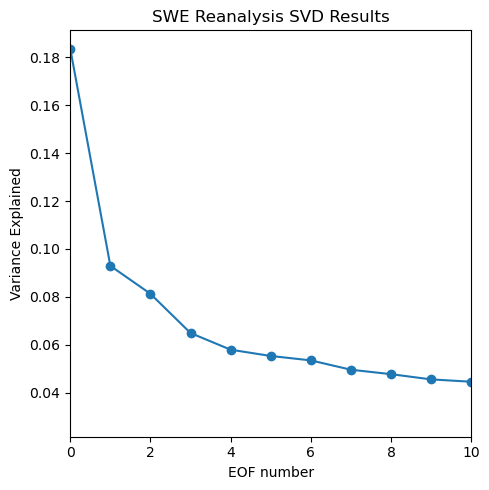

In [117]:
plt.figure(figsize=(5,5))
plt.plot(var_exp,'-o')
plt.xlabel('EOF number')
plt.ylabel('Variance Explained')
#plt.title('SVD Variance Explained')
#plt.ylim([0,0.16])
plt.xlim([0,10])
plt.title('SWE Reanalysis SVD Results')
plt.tight_layout()
plt.savefig('../figures/91823/reanalysis_eof_varianceexplained.jpeg');

In [118]:
# the first 10:
#print(var_exp[0:10])

# sum of the first 10
print('Percent of overall variance explained by \nthe top 10 patterns = {}%'.format( np.round( 100*np.sum(var_exp[0:10]),1)), '\nthe top 4 patterns = {}%'.format( np.round( 100*np.sum(var_exp[0:4]),1)))

Percent of overall variance explained by 
the top 10 patterns = 73.2% 
the top 4 patterns = 42.3%


In [119]:
Ur.shape

(1426740, 17)

In [120]:
Ur_t = Ur.T
Vr_t = Vr.T
print(Ur_t.shape)
print(Vr_t.shape)

(17, 1426740)
(17, 17)


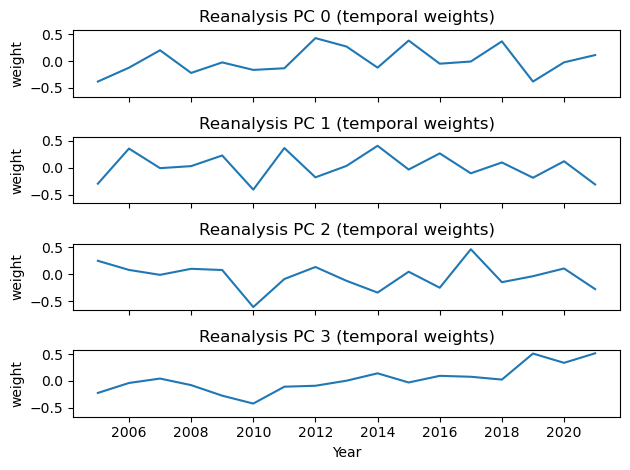

In [129]:
#Plot first PC (V)
f, ax = plt.subplots(4,1, sharex=True, sharey=True)
i=0
for row in range(4): 
    ax[row].plot(np.linspace(2005, 2021, num=17, dtype=int),Vr[i,:])
    ax[row].set_ylabel('weight')
    ax[row].set_title(f'Reanalysis PC {i} (temporal weights)')
    i+=1
ax[3].set_xlabel('Year')
plt.tight_layout()
plt.savefig('../figures/91823/reanalysis_pc_plots.jpeg')

In [25]:
subset.shape

(32, 903, 1580)

In [122]:
# dims: [time, y, x] 

Ur_t_reshaped = Ur_t.reshape(
        subset_years.shape[0], subset_years.shape[1], subset_years.shape[2]
    )

In [31]:
np.linspace(1, 32, num=32, dtype=int)

array([ 1,  2,  3,  4,  5,  6,  7,  8,  9, 10, 11, 12, 13, 14, 15, 16, 17,
       18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32])

In [125]:
Ur_t_reshaped = Ur_t.reshape(
        subset_years.shape[0], subset_years.shape[2], subset_years.shape[1]
    )

Ur_dataArray = xr.DataArray(data = Ur_t_reshaped,
                           dims=("EOF","x","y"),
                           coords=[np.linspace(1, 17, num=17, dtype=int),subset_years.x,subset_years.y])

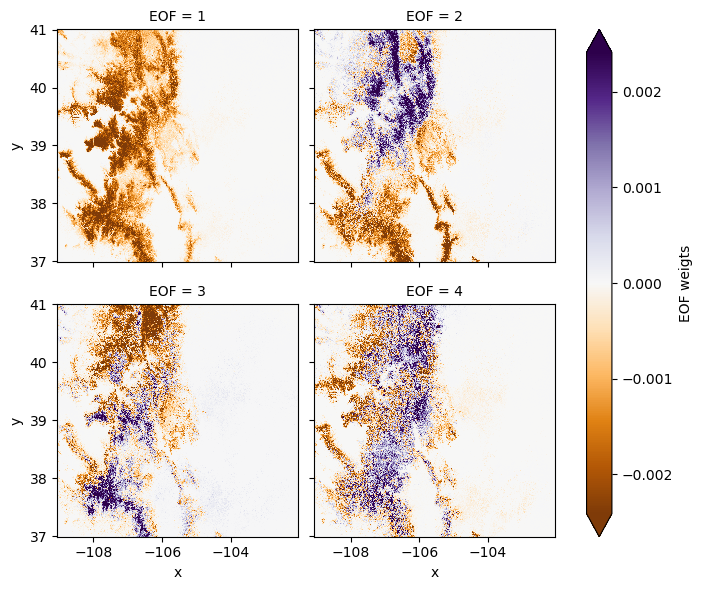

In [126]:
firstFour = Ur_dataArray.isel(EOF=slice(0, 4)).copy()

g = firstFour.plot.pcolormesh(
    x="x",
    y="y",
    col="EOF",
    col_wrap=2,
    robust=True,
    cmap="PuOr",
    cbar_kwargs={"label": "EOF weigts"},
)
plt.savefig('../figures/91823/reanalysis_eof_plots.jpeg')

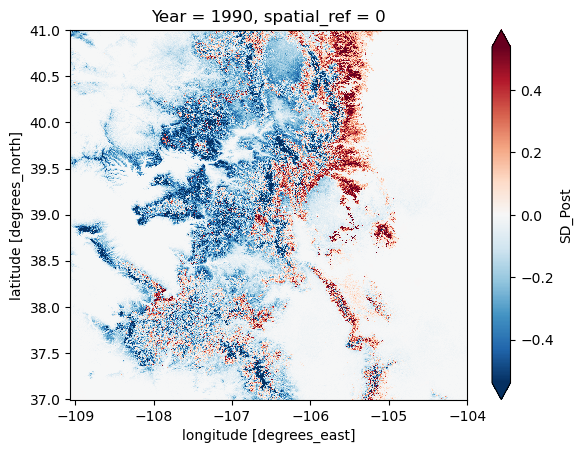

In [11]:
subset[0].plot(robust=True)

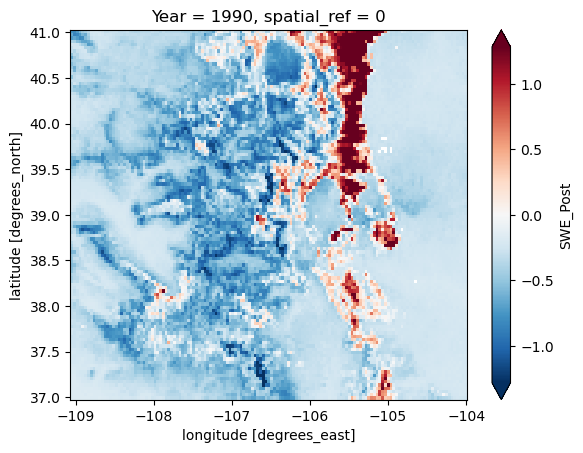

In [24]:
subset_coarser[0].plot(robust=True)

In [8]:
subset_years = subset[15:32,:,:]

In [141]:
subset

<xarray.DataArray 'SD_Post' (Year: 32, y: 903, x: 1580)>
dask.array<getitem, shape=(32, 903, 1580), dtype=float32, chunksize=(1, 903, 1580), chunktype=numpy.ndarray>
Coordinates:
  * y            (y) float64 36.99 37.0 37.0 37.01 ... 40.99 40.99 41.0 41.0
  * x            (x) float64 -109.1 -109.1 -109.1 ... -102.1 -102.0 -102.0
  * Year         (Year) int64 1990 1991 1992 1993 1994 ... 2018 2019 2020 2021
    spatial_ref  int64 0

In [14]:
from eofs.xarray import Eof
solver = Eof(flat_anom)

type: error encountered in SVD, check that missing values are in the same places at each time and that all the values are not missing

In [33]:
array_anom_stdev = flat_anom_stdev.to_numpy()

/Users/Hannah/micromamba/envs/analysis_2023/lib/python3.9/site-packages/dask/array/numpy_compat.py:43: RuntimeWarning: invalid value encountered in divide
  x = np.divide(x1, x2, out)


In [38]:
array_anom_stdev

array([[        nan,         nan,         nan, ..., -0.40999788,
        -0.40157187, -0.43360394],
       [        nan,         nan,         nan, ..., -0.40054965,
        -0.39558816, -0.4269656 ],
       [        nan,         nan,         nan, ..., -0.40046692,
        -0.40036058, -0.43105295],
       ...,
       [        nan,         nan,         nan, ..., -0.35956955,
        -0.35130987, -0.39662308],
       [        nan,         nan,         nan, ...,  0.0123468 ,
         0.06808702,  0.04019716],
       [        nan,         nan,         nan, ..., -0.4087961 ,
        -0.39821774, -0.43024808]], dtype=float32)

In [32]:
flat_anom_stdev

<xarray.DataArray 'SWE_Post' (Year: 32, z: 326876)>
dask.array<reshape, shape=(32, 326876), dtype=float32, chunksize=(1, 326876), chunktype=numpy.ndarray>
Coordinates:
    spatial_ref  int64 0
  * Year         (Year) int64 1990 1991 1992 1993 1994 ... 2018 2019 2020 2021
  * z            (z) object MultiIndex
  * x            (z) float64 -125.0 -125.0 -125.0 ... -102.0 -102.0 -102.0
  * y            (z) float64 31.02 31.05 31.09 31.12 ... 48.87 48.9 48.94 48.97

In [28]:
masked_array = anomalies_sdev_coarser.to_masked_array()

/Users/Hannah/micromamba/envs/analysis_2023/lib/python3.9/site-packages/dask/array/numpy_compat.py:43: RuntimeWarning: invalid value encountered in divide
  x = np.divide(x1, x2, out)


In [36]:
raveled_arr

array([-0.20192774,  0.2930089 ,  0.30459756, ..., -0.4087961 ,
       -0.39821774, -0.43024808], dtype=float32)

In [30]:
Uma, Sma, Vma = svd(masked_array.T,full_matrices=False)

type: masked arrays are not supported

In [9]:
flattened_subset = subset_years.stack(z=('x','y'))
flattened_subset

<xarray.DataArray 'SD_Post' (Year: 17, z: 1028517)>
dask.array<reshape, shape=(17, 1028517), dtype=float32, chunksize=(1, 1028517), chunktype=numpy.ndarray>
Coordinates:
  * Year         (Year) int64 2005 2006 2007 2008 2009 ... 2018 2019 2020 2021
    spatial_ref  int64 0
  * z            (z) object MultiIndex
  * x            (z) float64 -109.1 -109.1 -109.1 ... -104.0 -104.0 -104.0
  * y            (z) float64 36.99 37.0 37.0 37.01 ... 40.99 40.99 41.0 41.0

In [16]:
flattened_anomalies = anomalies.stack(z=('x','y'))

In [27]:
np.isinf(flat_anom)

<xarray.DataArray 'SWE_Post' (time: 32, z: 326876)>
dask.array<isinf, shape=(32, 326876), dtype=bool, chunksize=(1, 326876), chunktype=numpy.ndarray>
Coordinates:
    spatial_ref  int64 0
  * time         (time) int64 1990 1991 1992 1993 1994 ... 2018 2019 2020 2021
  * z            (z) object MultiIndex
  * x            (z) float64 -125.0 -125.0 -125.0 ... -102.0 -102.0 -102.0
  * y            (z) float64 31.02 31.05 31.09 31.12 ... 48.87 48.9 48.94 48.97

In [115]:
Ur.shape

(1426740, 17)

In [106]:
combined_april1_anom_co

,303_CO_SNTL,1030_CO_SNTL,1061_CO_SNTL,327_CO_SNTL,1041_CO_SNTL,335_CO_SNTL,345_CO_SNTL,369_CO_SNTL,938_CO_SNTL,913_CO_SNTL,...,802_CO_SNTL,827_CO_SNTL,839_CO_SNTL,840_CO_SNTL,1005_CO_SNTL,843_CO_SNTL,859_WY_SNTL,870_CO_SNTL,874_CO_SNTL,1033_CO_SNTL
2005-04-01,34.76,8.761905,1.894737,36.608696,7.45,-0.285714,22.730769,0.15,0.583333,-5.0,...,7.05,15.47619,15.684211,53.684211,80.347826,47.173913,-1.857143,-1.318182,51.307692,0.666667
2006-04-01,-9.24,9.761905,4.894737,9.608696,4.45,7.714286,18.730769,3.15,2.583333,9.0,...,10.05,24.47619,-4.315789,-8.315789,-15.652174,-3.826087,15.142857,0.681818,-5.692308,13.666667
2007-04-01,-1.24,-3.238095,-0.105263,-9.391304,-9.55,2.714286,-6.269231,-5.85,1.583333,-14.0,...,-1.95,5.47619,-13.315789,-18.315789,-16.652174,-14.826087,-17.857143,-1.318182,-5.692308,-14.333333
2008-04-01,17.76,11.761905,5.894737,19.608696,18.45,15.714286,22.730769,15.15,9.583333,3.0,...,21.05,24.47619,14.684211,23.684211,12.347826,23.173913,24.142857,9.681818,25.307692,21.666667
2009-04-01,2.76,1.761905,1.894737,-1.391304,11.45,6.714286,12.730769,6.15,2.583333,3.0,...,7.05,25.47619,-7.315789,-0.315789,2.347826,-8.826087,20.142857,1.681818,3.307692,14.666667
2010-04-01,19.76,-11.238095,-1.105263,6.608696,-7.55,-5.285714,-2.269231,-0.85,-2.416667,-14.0,...,-11.95,4.47619,9.684211,5.684211,19.347826,13.173913,-3.857143,-7.318182,2.307692,-15.333333
2011-04-01,-8.24,25.761905,12.894737,2.608696,9.45,17.714286,34.730769,11.15,9.583333,18.0,...,15.05,25.47619,-9.315789,-4.315789,-9.652174,-3.826087,32.142857,21.681818,-3.692308,33.666667
2012-04-01,-3.24,-25.238095,-15.105263,-24.391304,-22.55,-38.285714,-23.269231,-20.85,-15.416667,-11.0,...,-27.95,-25.52381,-13.315789,-32.315789,-21.652174,-20.826087,-33.857143,-27.318182,-21.692308,-31.333333
2013-04-01,-10.24,-10.238095,-7.105263,-14.391304,-4.55,-7.285714,-16.269231,-12.85,-8.416667,-3.0,...,-4.95,-1.52381,-9.315789,-13.315789,-2.652174,-11.826087,-16.857143,-15.318182,-28.692308,-16.333333
2014-04-01,-14.24,20.761905,9.894737,-1.391304,10.45,15.714286,5.730769,10.15,6.583333,23.0,...,9.05,11.47619,0.684211,-7.315789,-1.652174,-7.826087,32.142857,15.681818,-10.692308,29.666667


In [107]:
combined_april1_anom_co_years = combined_april1_anom_co[:-2]

In [113]:
# for comparison

combined_april1_anom_co_years_array = combined_april1_anom_co_years.to_numpy()

In [114]:
Uco, Sco, Vco = svd(combined_april1_anom_co_years_array.T,full_matrices=False)

In [116]:
# SVD Variance Explained, divide S values by the sum of all S
var_exp = Sr / np.sum(Sr)

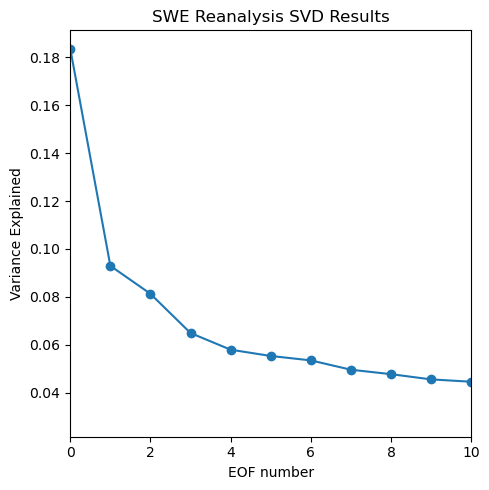

In [117]:
plt.figure(figsize=(5,5))
plt.plot(var_exp,'-o')
plt.xlabel('EOF number')
plt.ylabel('Variance Explained')
#plt.title('SVD Variance Explained')
#plt.ylim([0,0.16])
plt.xlim([0,10])
plt.title('SWE Reanalysis SVD Results')
plt.tight_layout()
plt.savefig('../figures/91823/reanalysis_eof_varianceexplained.jpeg');

In [118]:
# the first 10:
#print(var_exp[0:10])

# sum of the first 10
print('Percent of overall variance explained by \nthe top 10 patterns = {}%'.format( np.round( 100*np.sum(var_exp[0:10]),1)), '\nthe top 4 patterns = {}%'.format( np.round( 100*np.sum(var_exp[0:4]),1)))

Percent of overall variance explained by 
the top 10 patterns = 73.2% 
the top 4 patterns = 42.3%


In [119]:
Ur.shape

(1426740, 17)

In [120]:
Ur_t = Ur.T
Vr_t = Vr.T
print(Ur_t.shape)
print(Vr_t.shape)

(17, 1426740)
(17, 17)


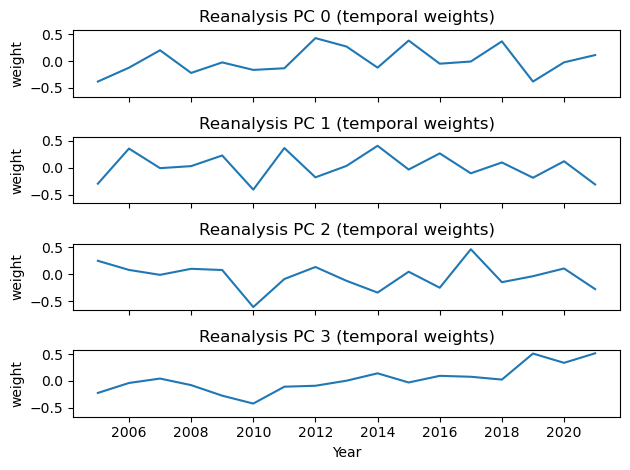

In [129]:
#Plot first PC (V)
f, ax = plt.subplots(4,1, sharex=True, sharey=True)
i=0
for row in range(4): 
    ax[row].plot(np.linspace(2005, 2021, num=17, dtype=int),Vr[i,:])
    ax[row].set_ylabel('weight')
    ax[row].set_title(f'Reanalysis PC {i} (temporal weights)')
    i+=1
ax[3].set_xlabel('Year')
plt.tight_layout()
plt.savefig('../figures/91823/reanalysis_pc_plots.jpeg')

In [25]:
subset.shape

(32, 903, 1580)

In [122]:
# dims: [time, y, x] 

Ur_t_reshaped = Ur_t.reshape(
        subset_years.shape[0], subset_years.shape[1], subset_years.shape[2]
    )

In [31]:
np.linspace(1, 32, num=32, dtype=int)

array([ 1,  2,  3,  4,  5,  6,  7,  8,  9, 10, 11, 12, 13, 14, 15, 16, 17,
       18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32])

In [125]:
Ur_t_reshaped = Ur_t.reshape(
        subset_years.shape[0], subset_years.shape[2], subset_years.shape[1]
    )

Ur_dataArray = xr.DataArray(data = Ur_t_reshaped,
                           dims=("EOF","x","y"),
                           coords=[np.linspace(1, 17, num=17, dtype=int),subset_years.x,subset_years.y])

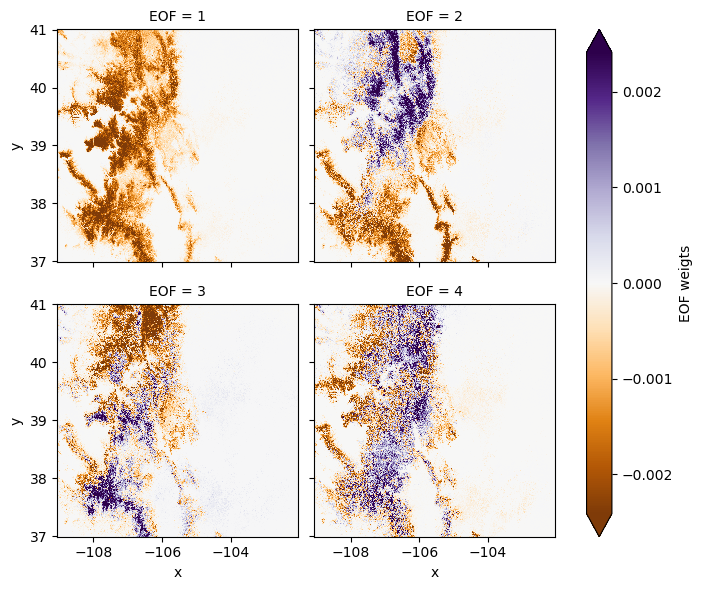

In [126]:
firstFour = Ur_dataArray.isel(EOF=slice(0, 4)).copy()

g = firstFour.plot.pcolormesh(
    x="x",
    y="y",
    col="EOF",
    col_wrap=2,
    robust=True,
    cmap="PuOr",
    cbar_kwargs={"label": "EOF weigts"},
)
plt.savefig('../figures/91823/reanalysis_eof_plots.jpeg')

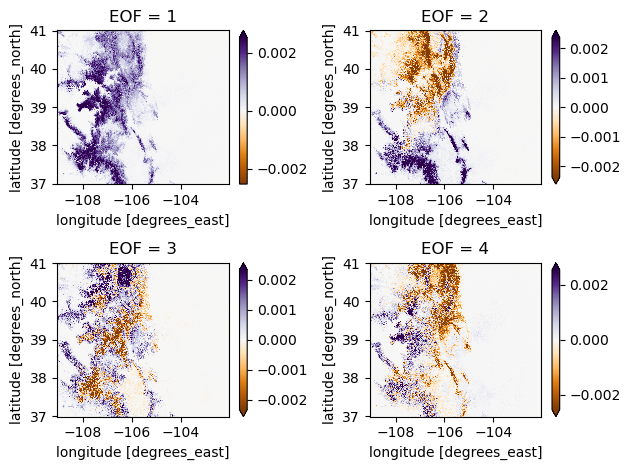

In [65]:
f, ax = plt.subplots(2,2)
i = 0
for row in range(2):
    for column in range(2):
        Ur_dataArray[i].T.plot(ax=ax[row,column], robust=True, cmap='PuOr')
        i+=1
plt.tight_layout()
plt.savefig('../figures/91823/reanalysis_eof_plots.jpeg')

type: 'Axes' object is not subscriptable

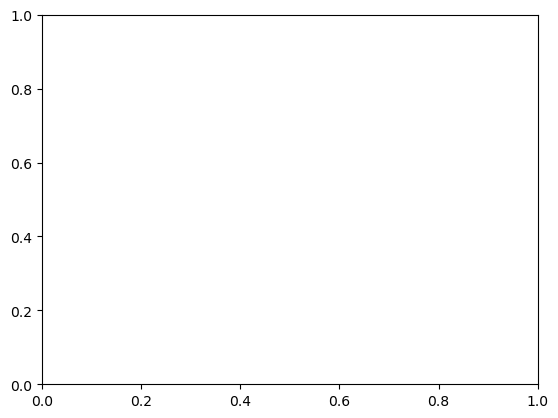

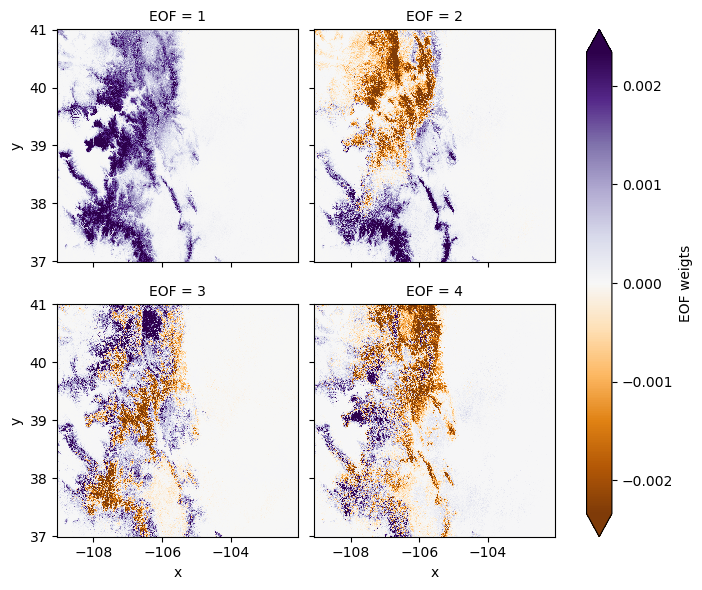

In [73]:
firstFour = Ur_dataArray.isel(EOF=slice(0, 4)).copy()

fig, ax = plt.subplots()
g = firstFour.plot.pcolormesh(
    x="x",
    y="y",
    col="EOF",
    col_wrap=2,
    robust=True,
    cmap="PuOr",
    cbar_kwargs={"label": "EOF weigts"},
)
i = 0
for row in range(2):
    for column in range(2):
        Ur_dataArray[i].T.plot(ax=ax[row,column], robust=True, cmap='PuOr')
        station_locations_co.plot(ax=ax[row,column], column=Uco[:,i], legend=False, cmap='PuOr', vmin=-0.16, vmax=0.16, markersize=3,marker='o')
        i+=1

In [74]:
import seaborn as sns

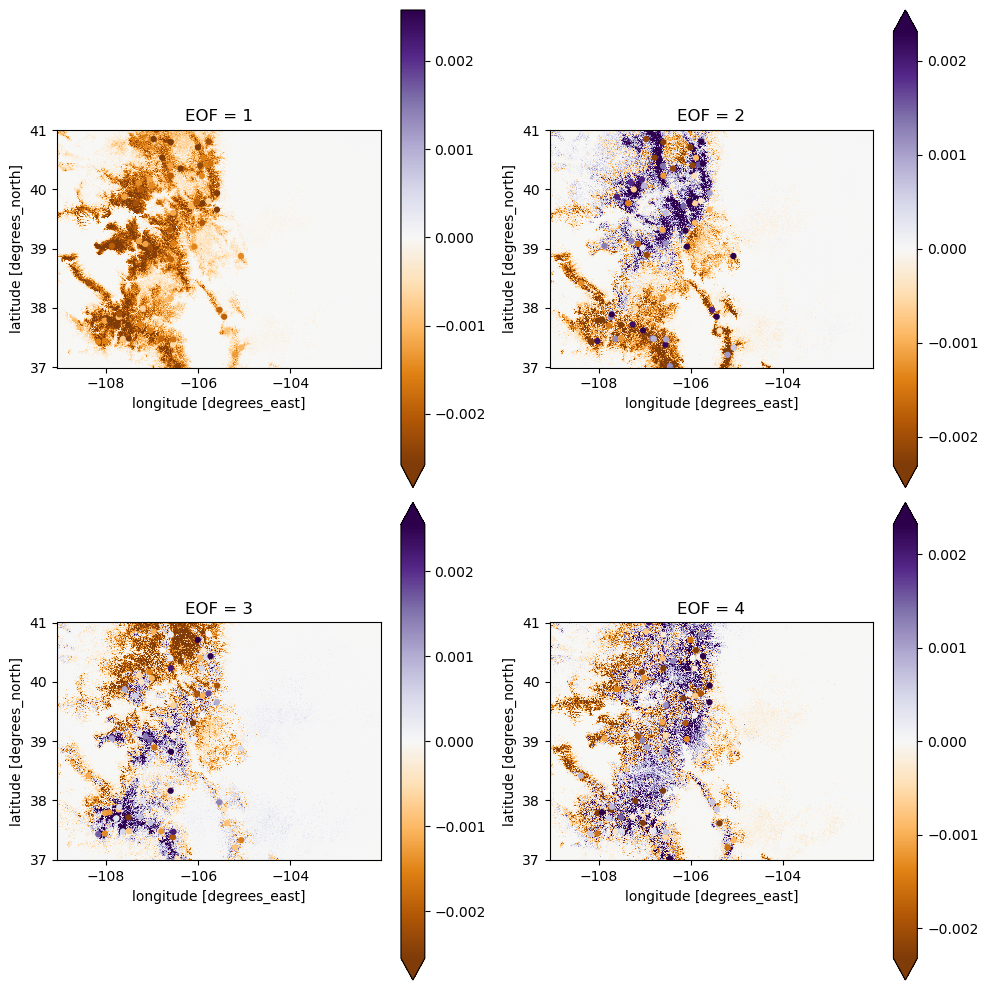

In [130]:
f, ax = plt.subplots(2,2,figsize=(10,10))
i = 0
for row in range(2):
    for column in range(2):
        Ur_dataArray[i].T.plot(ax=ax[row,column], robust=True, cmap='PuOr')
        station_locations_co.plot(ax=ax[row,column], column=Uco[:,i], legend=False, cmap='PuOr', vmin=-0.16, vmax=0.16, markersize=12,marker='o')
        i+=1
#sns.move_legend(plt.gca(), loc='center left', bbox_to_anchor=(1, 0.5))
plt.tight_layout()
plt.savefig('../figures/91823/reanalysis_station_eof_plots.jpeg')

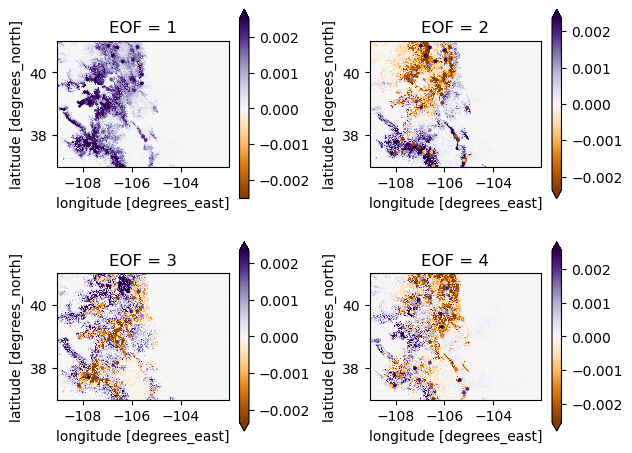

In [64]:
f, ax = plt.subplots(2,2)
i = 0
for row in range(2):
    for column in range(2):
        Ur_dataArray[i].T.plot(ax=ax[row,column], robust=True, cmap='PuOr')
        station_locations_co.plot(ax=ax[row,column], column=Uco[:,i], legend=False, cmap='PuOr_r', vmin=-0.16, vmax=0.16, markersize=3,marker='o')

        # ax[row,column].set_xlim(-109.2,-102.5)
        # ax[row,column].set_ylim(36.7,41.2)
        # ctx.add_basemap(ax=ax[row,column], crs='epsg:4326', source=ctx.providers.Stamen.Terrain, attribution=False)
        # colorado.plot(ax=ax[row,column], facecolor='none', edgecolor='k')
        # ax[row,column].set_title('EOF {}'.format(i+1))
        # ax[row,column].set_xlabel('Longitude')
        # ax[row,column].set_ylabel('Latitude')
        i+=1
plt.tight_layout()
#plt.savefig('../figures/91823/station_eof_plots.jpeg')

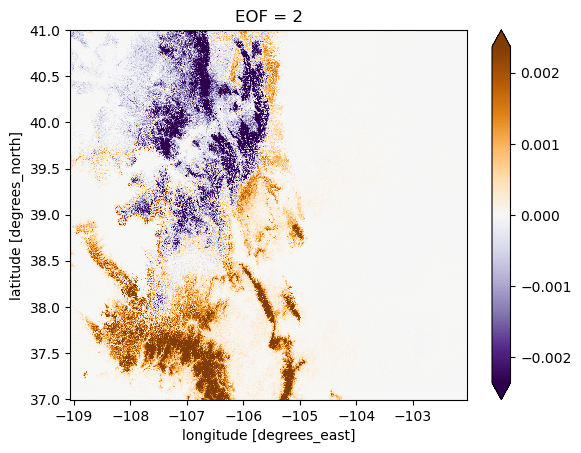

In [36]:
Ur_dataArray[1].T.plot(robust=True, cmap='PuOr_r')

In [131]:
# Perform the SVD on entire western US

# perform svd analysis on swe reanalysis data
#Ura, Sra, Vra = svd(flattened_anomalies.T,full_matrices=False)

Need to deal with nan values inherent to nonrectangular data

## K-means Clustering analysis

To Do:  
* replace nans with zeros
* coarsen to...? 8 times?
* look into using the linux box for pc calculation

In [15]:
flattened_subset.shape

(17, 1028517)

In [10]:
np.corrcoef?

Signature:
np.corrcoef(
    x,
    y=None,
    rowvar=True,
    bias=<no value>,
    ddof=<no value>,
    *,
    dtype=None,
)
Docstring:
Return Pearson product-moment correlation coefficients.

Please refer to the documentation for `cov` for more detail.  The
relationship between the correlation coefficient matrix, `R`, and the
covariance matrix, `C`, is

.. math:: R_{ij} = \frac{ C_{ij} } { \sqrt{ C_{ii} C_{jj} } }

The values of `R` are between -1 and 1, inclusive.

Parameters
----------
x : array_like
    A 1-D or 2-D array containing multiple variables and observations.
    Each row of `x` represents a variable, and each column a single
    observation of all those variables. Also see `rowvar` below.
y : array_like, optional
    An additional set of variables and observations. `y` has the same
    shape as `x`.
rowvar : bool, optional
    If `rowvar` is True (default), then each row represents a
    variable, with observations in the columns. Otherwise, the relationship
    is tra

In [ ]:
pearsons_cc = np.corrcoef(flattened_subset.T)

In [12]:
pearsons_cc.shape

(17, 17)

Too much data - corrcoef makes a matrix with square dimensions equal to the longer side. This is currently the filter point for this analysis. Need to figure out how to streamline this. Some ideas include:  
* Dask
* Linux box
* manually chunk data - does this result in edge effects?